In [ ]:
install.packages("igraph")
install.packages("pracma", repos="http://R-Forge.R-project.org")
install.packages("matrixStats")


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library('igraph')
library('Matrix')
library('pracma')
library('matrixStats')
library('readr')
set.seed(1)
options(warn=-1)


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



Attaching package: ‘pracma’


The following objects are masked from ‘package:Matrix’:

    expm, lu, tril, triu




In [ ]:
download.file("http://snap.stanford.edu/data/facebook_combined.txt.gz","/content/facebook_combined.txt")
unzip(zipfile="/content/facebook_combined.zip",exdir=".")

facebook_data <-read.table('/content/facebook_combined.txt')

In [ ]:
facebook_graph <-graph.data.frame(facebook_data, directed = FALSE)

**Question 1**

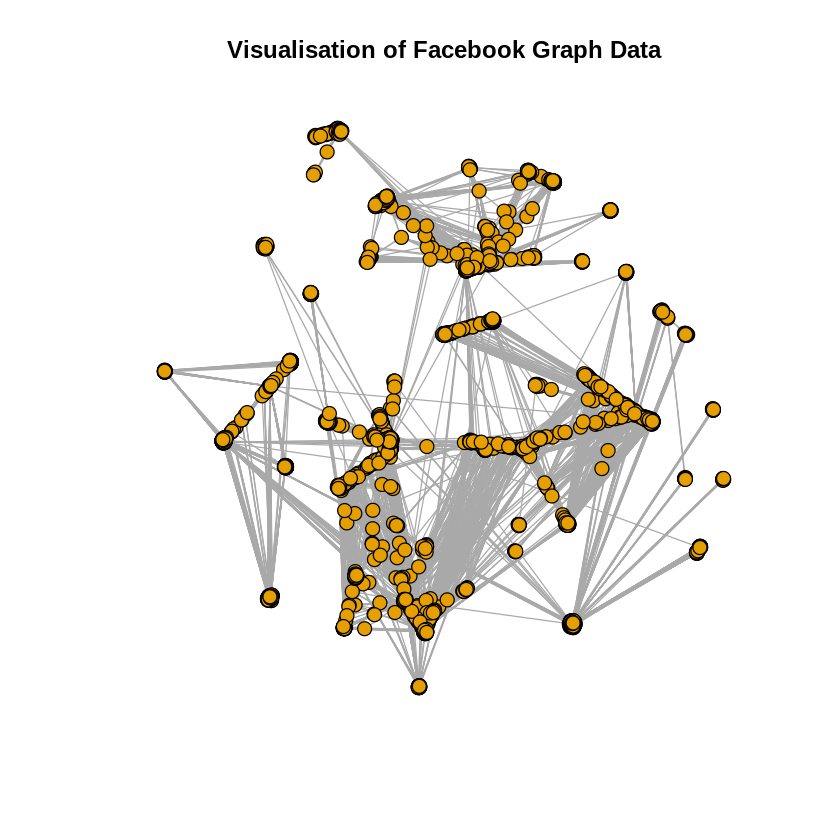

In [ ]:
plot(facebook_graph,vertex.label="",vertex.size=5)
title(main ="Visualisation of Facebook Graph Data")

In [ ]:
print(sprintf("The number of nodes in the network is %d",vcount(facebook_graph)))
print(sprintf("The number of edges in the network is %d",ecount(facebook_graph)))

[1] "The number of nodes in the network is 4039"
[1] "The number of edges in the network is 88234"


In [ ]:
if(is.connected(facebook_graph)){
  print(sprintf("The graph is connected"))
}else{
  g_clusters<-clusters(facebook_graph)
  biggest_cluster_id <- which.max(g_clusters$csize)
  vert_ids <- V(facebook_graph)[g_clusters$membership == biggest_cluster_id] 
  gcc_graph = induced_subgraph(facebook_graph, vert_ids)
  diameter_data[i] = diameter(gcc_graph)}

[1] "The graph is connected"


**Question 2**

In [ ]:
print(sprintf("The diameter of the netwrok is %d",diameter(facebook_graph)))

[1] "The diameter of the netwrok is 8"


**Question 3**

[1] "Mean of Facebook Graph 43.691 "


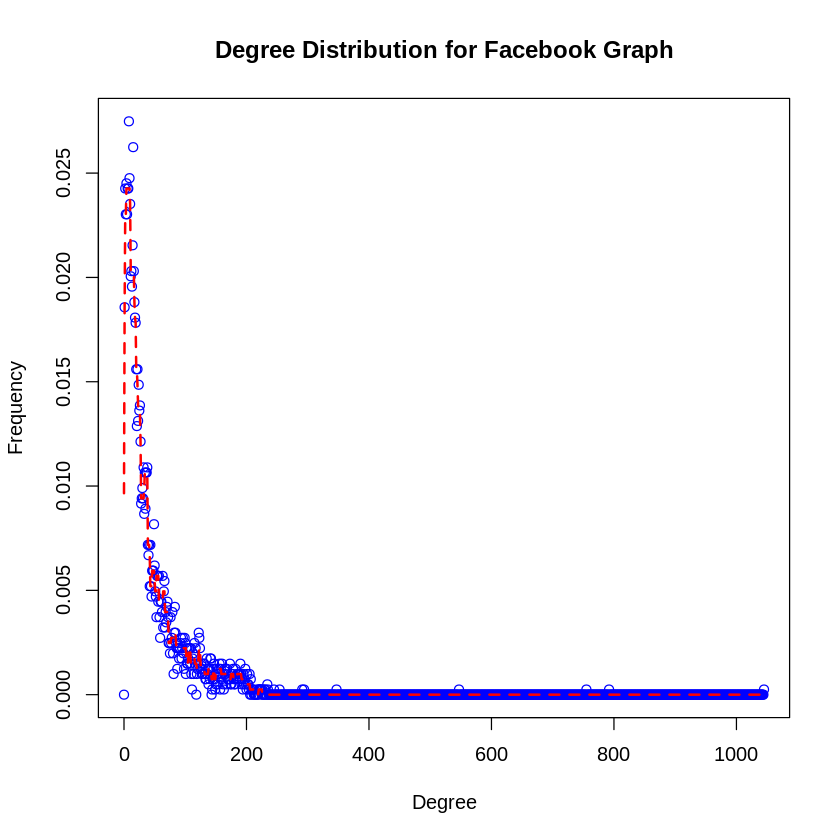

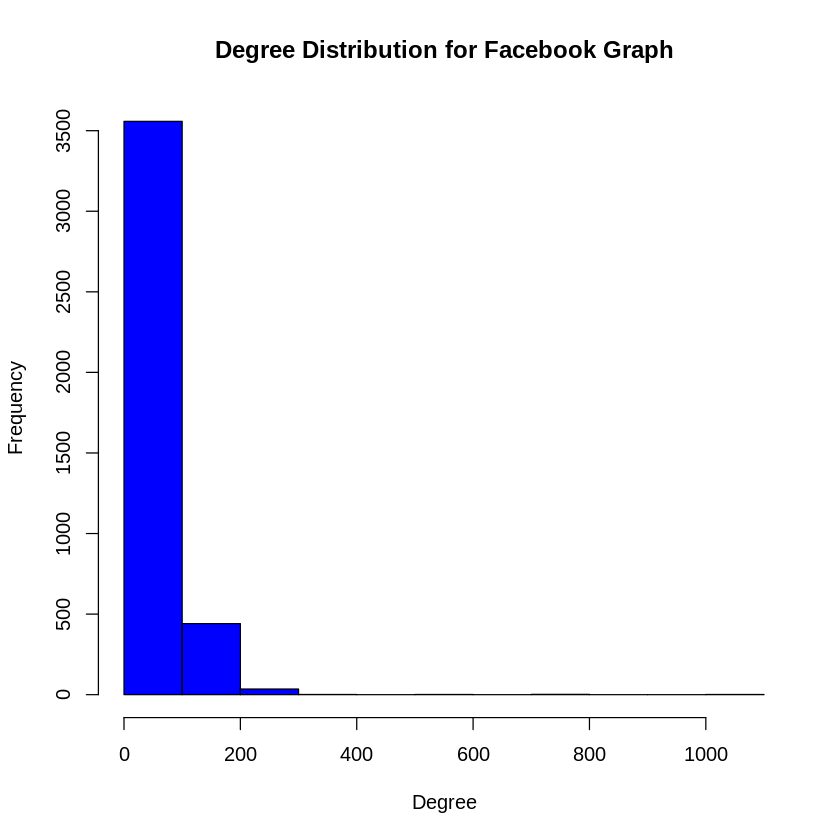

In [ ]:
print(sprintf("Mean of Facebook Graph %2.3f ",mean(degree(facebook_graph))))
plot(seq_along(degree.distribution(facebook_graph))-1,degree.distribution(facebook_graph),main=sprintf("Degree Distribution for Facebook Graph"),xlab="Degree",ylab="Frequency",col='blue')
lines(seq_along(degree.distribution(facebook_graph))-1,smooth(degree.distribution(facebook_graph)),col='red',lty=2,lwd=2)
hist(degree(facebook_graph),main=sprintf("Degree Distribution for Facebook Graph"),xlab="Degree",ylab="Frequency",col='blue')

**Question 4**

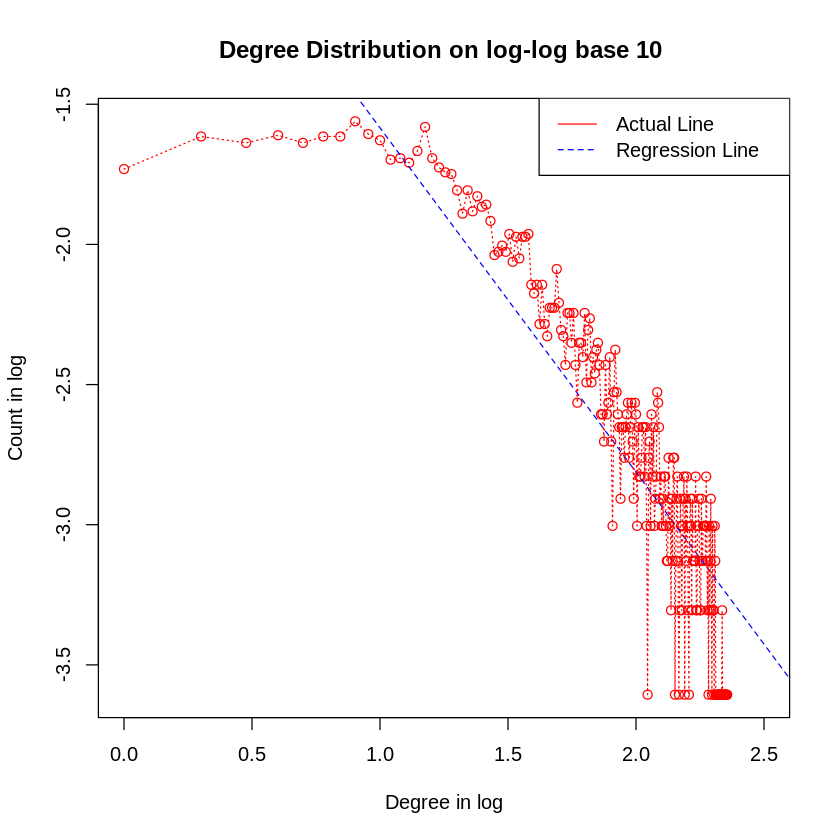

In [ ]:
facebook_degree <-degree.distribution(facebook_graph)

degree_for_log <-log10(facebook_degree)[which(facebook_degree!=0,arr.ind=TRUE)]
x_axis_for_facebook <-c(1:length(degree_for_log))
log_axis <-log10(x_axis_for_facebook)

plot(log_axis,degree_for_log,xlim=c(0,2.5),xlab="Degree in log",ylab="Count in log",main="Degree Distribution on log-log base 10 ",col='red',lwd=1)
abline(lm(degree_for_log~log_axis),col='blue',lty=2,lwd=1)
lines(log_axis,degree_for_log,lty=3,lwd=1,col='red')

legend('topright', legend = c("Actual Line ","Regression Line "),lty = c(1, 2), lwd = c(1,1),col = c('red','blue'))

In [ ]:
print(lm(degree_for_log~log_axis))


Call:
lm(formula = degree_for_log ~ log_axis)

Coefficients:
(Intercept)     log_axis  
    -0.3563      -1.2279  



**Question 5**

[1] "The number of vertices are 348 and number of edges are 2866"


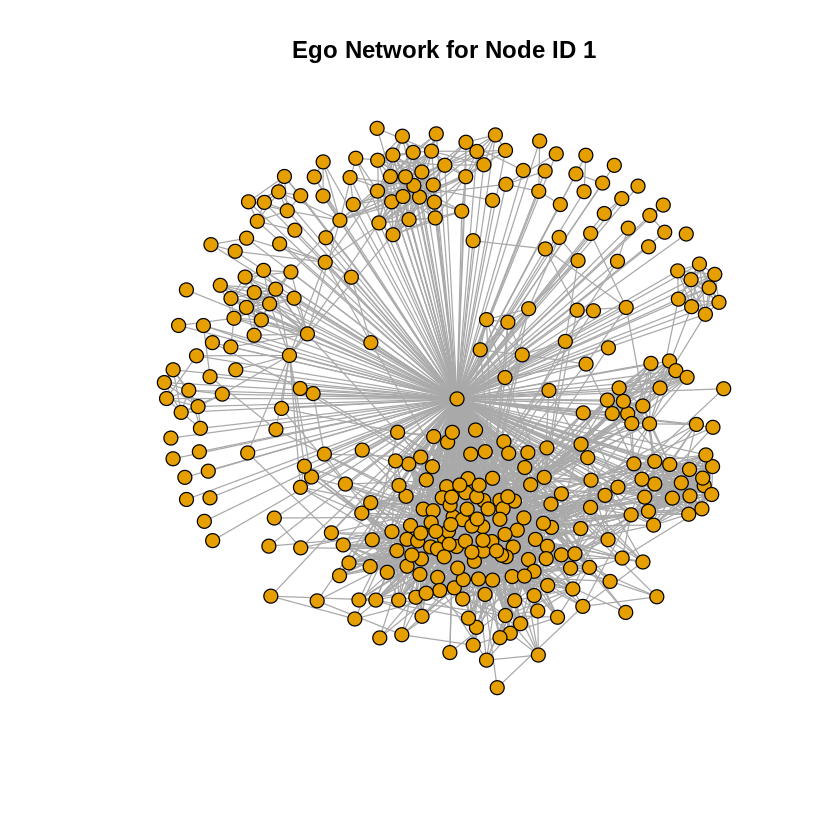

In [ ]:
personalised_network_graph <- induced_subgraph(facebook_graph, c(1, neighbors(facebook_graph,1)))
plot(personalised_network_graph,vertex.size=5,vertex.label ='',main="Ego Network for Node ID 1")
print(sprintf("The number of vertices are %d and number of edges are %d",vcount(personalised_network_graph),ecount(personalised_network_graph)))

**Question 6**

In [ ]:
print(sprintf("The diameter of the personalised network is %d",diameter(personalised_network_graph)))

[1] "The diameter of the personalised network is 2"


**Question 8**

In [ ]:
degree_facebook_graph = degree(facebook_graph)
core_nodes = degree_facebook_graph[which(degree_facebook_graph>200,arr.ind=TRUE)]

In [ ]:
print(sprintf("The number of core nodes are %d",length(core_nodes)))
print(sprintf("The mean degree of the core nodes are %3.3f",mean(core_nodes)))

[1] "The number of core nodes are 40"
[1] "The mean degree of the core nodes are 279.375"


In [ ]:
core_nodes

0  107  348  483 1086 1199 1352 1431 1584 1589 1663 1684 1730 1746 1768 1800 
 347 1045  229  231  205  217  234  220  211  205  235  792  226  202  209  245 
1827 1888 1912 1941 1985 1993 2047 2078 2123 2142 2206 2218 2229 2233 2240 2266 
 201  254  755  223  224  203  205  204  203  221  210  205  207  222  201  234 
2347 2410 2464 2507 2543 2560 2611 3437 
 291  207  202  201  294  201  207  547

**Question 9**

[1] "The Vertex Count 348, Edge Count 2866 for Personalised Network 1"
[1] "The modularity of graph with greedy algorithm is 0.413"
[1] "The modularity of graph with Edge Betweeness is 0.353"
[1] "The modularity of graph with Infomap is 0.389"


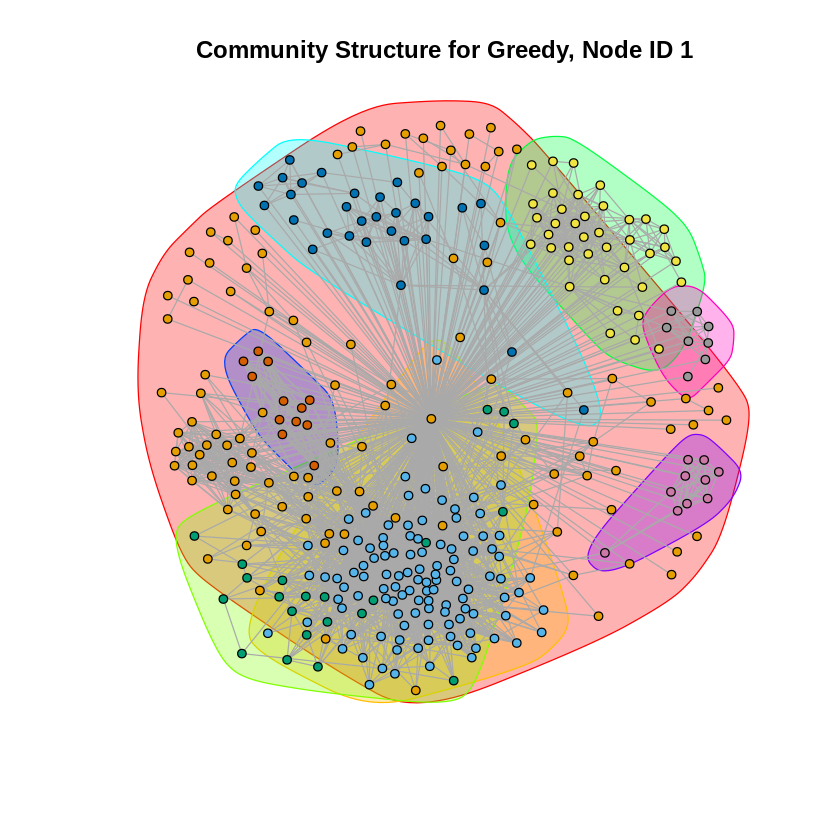

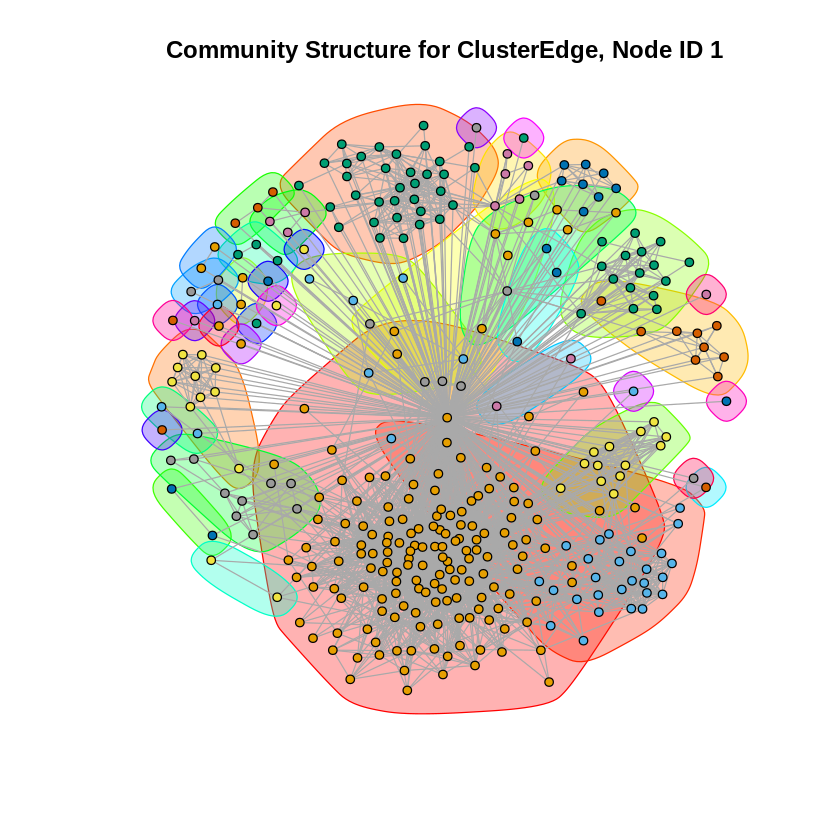

[1] "The Vertex Count 1046, Edge Count 27795 for Personalised Network 108"
[1] "The modularity of graph with greedy algorithm is 0.436"
[1] "The modularity of graph with Edge Betweeness is 0.507"
[1] "The modularity of graph with Infomap is 0.508"


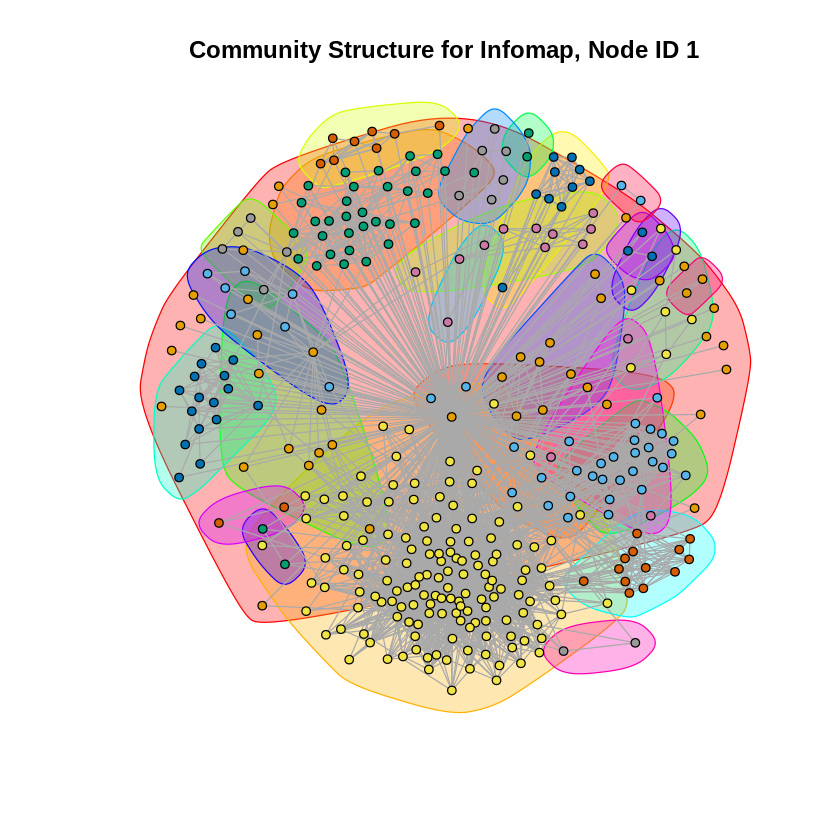

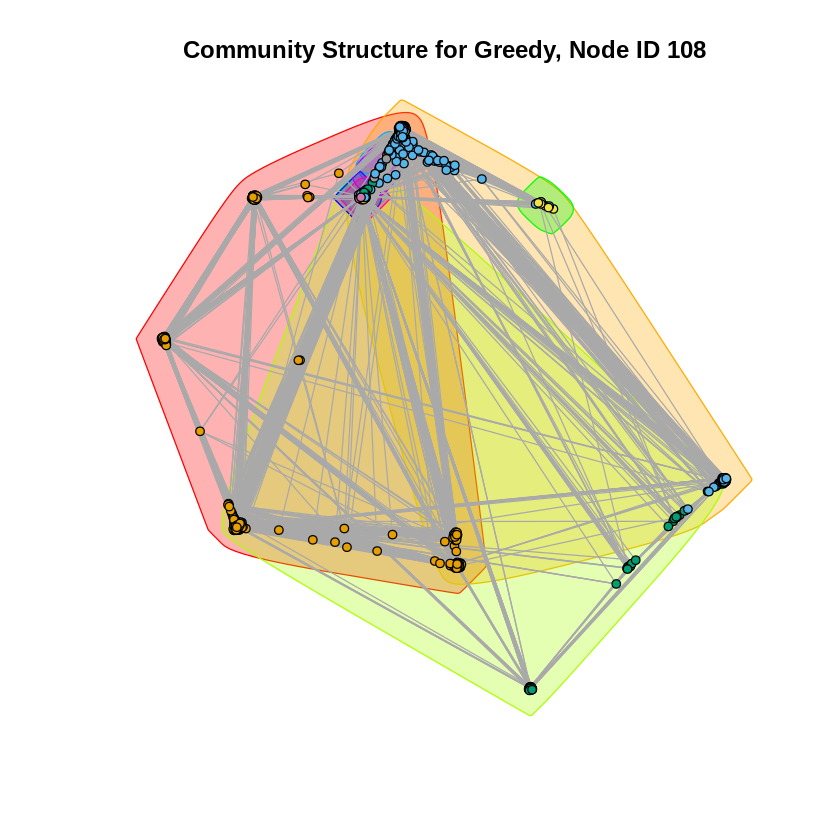

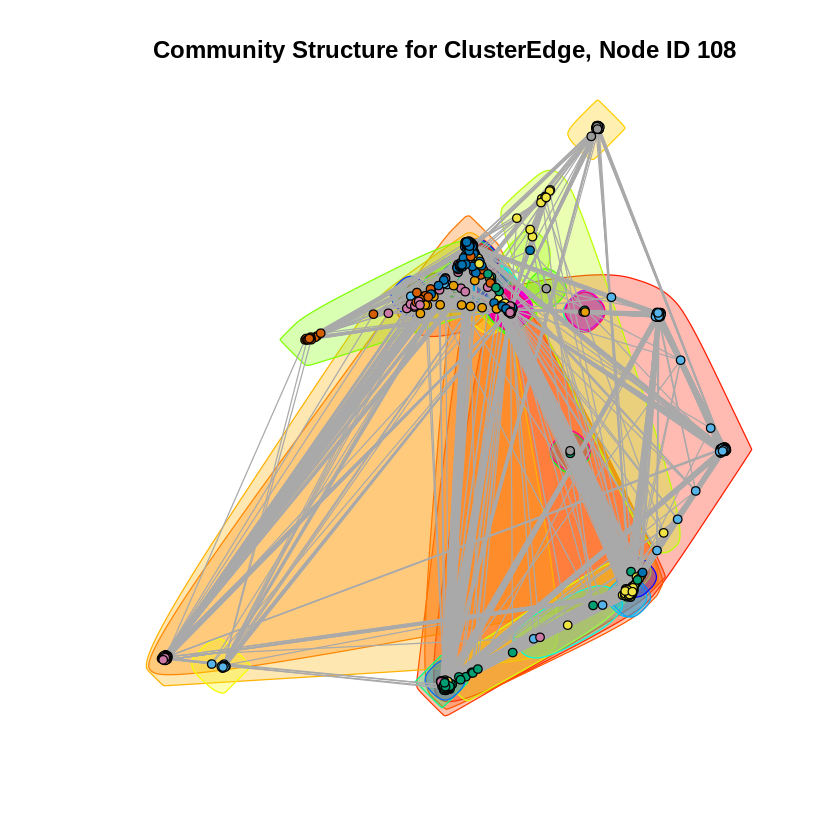

[1] "The Vertex Count 230, Edge Count 3441 for Personalised Network 349"
[1] "The modularity of graph with greedy algorithm is 0.250"
[1] "The modularity of graph with Edge Betweeness is 0.134"
[1] "The modularity of graph with Infomap is 0.095"


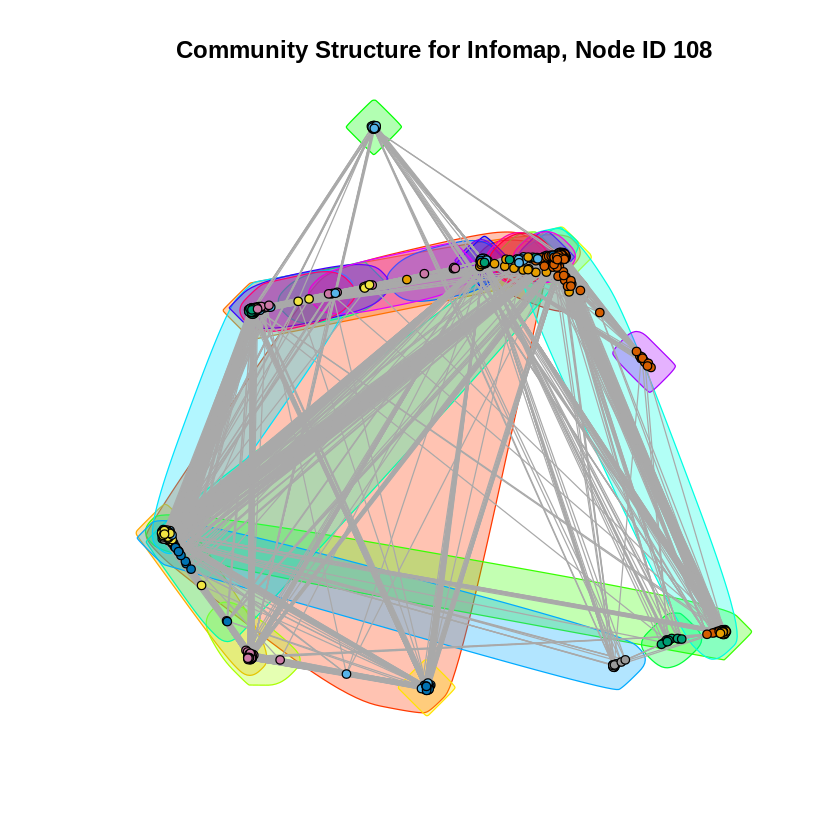

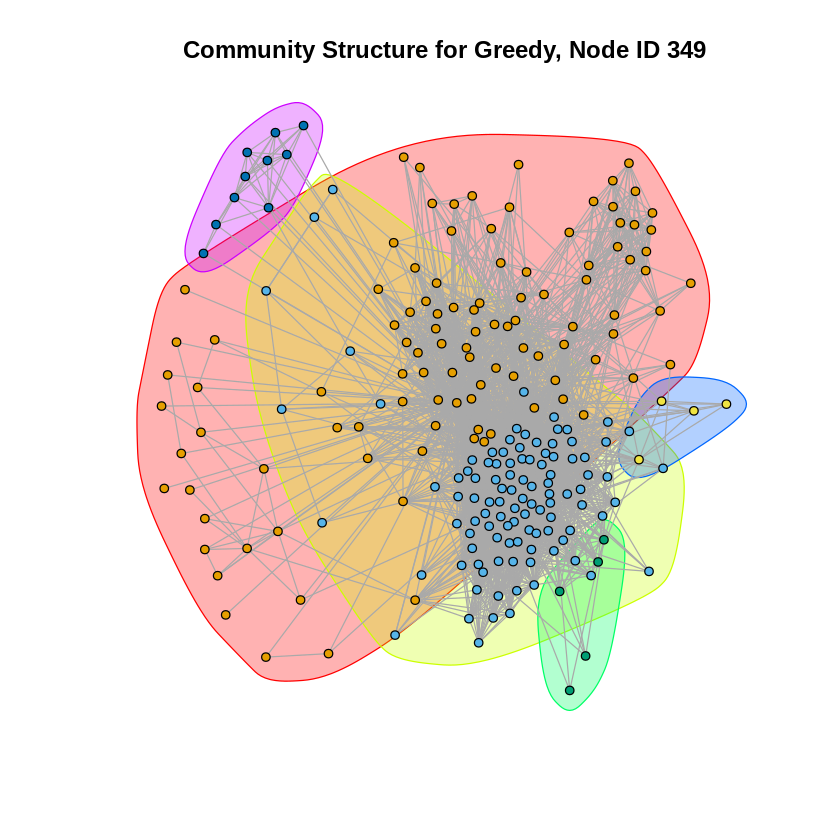

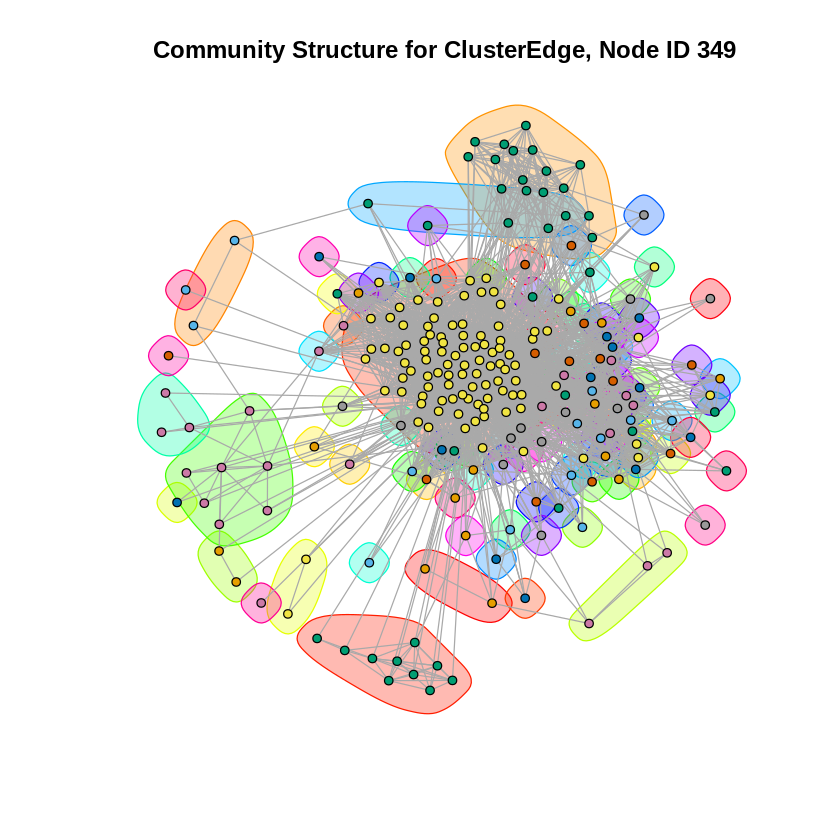

[1] "The Vertex Count 232, Edge Count 4525 for Personalised Network 484"
[1] "The modularity of graph with greedy algorithm is 0.507"
[1] "The modularity of graph with Edge Betweeness is 0.489"
[1] "The modularity of graph with Infomap is 0.515"


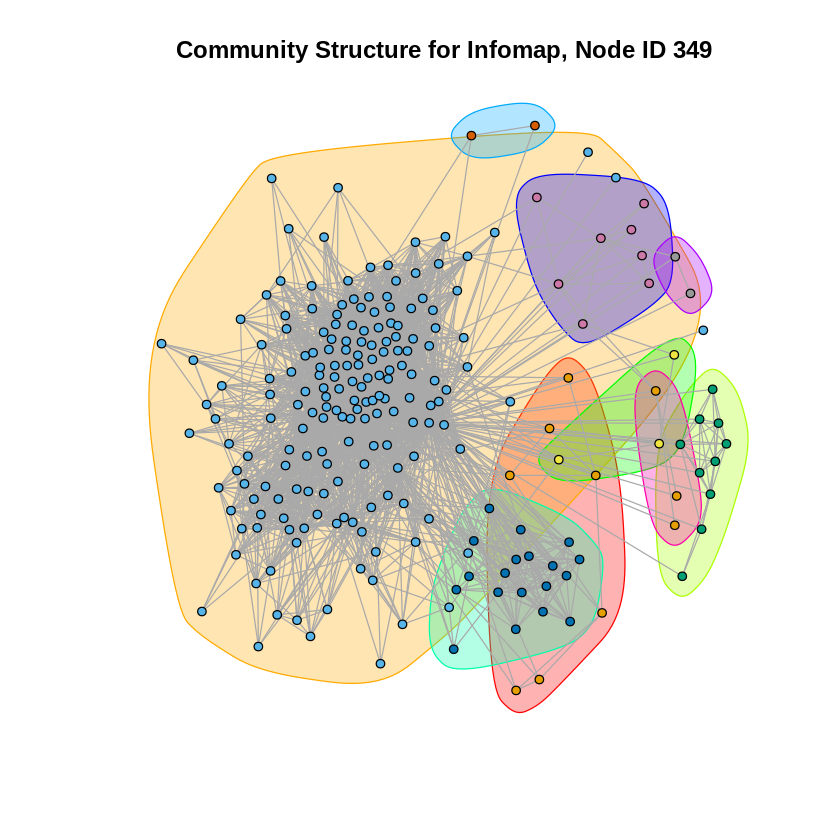

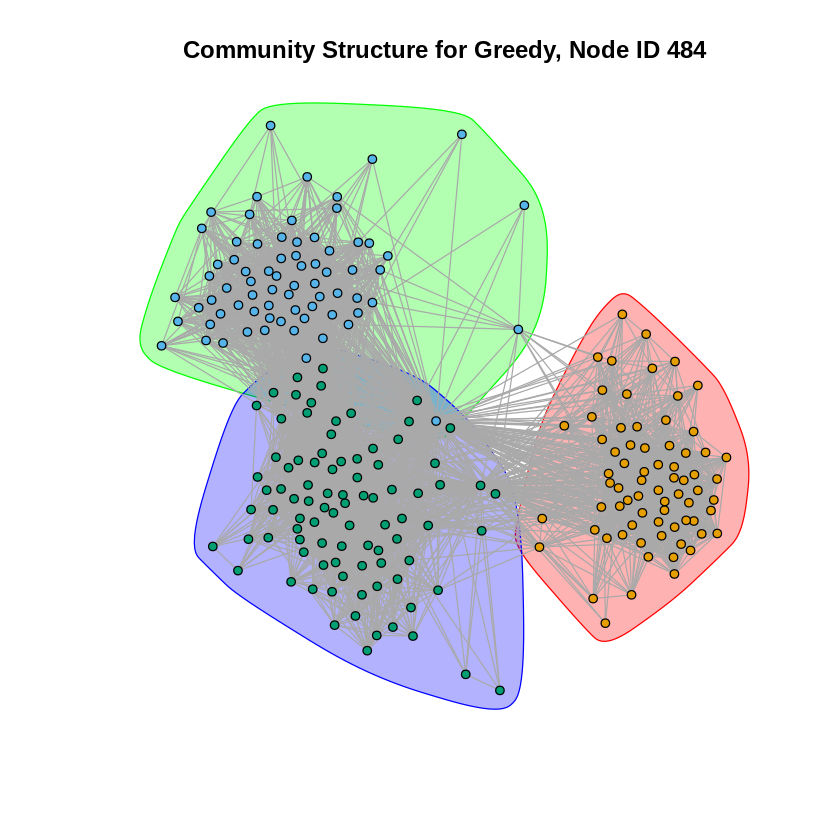

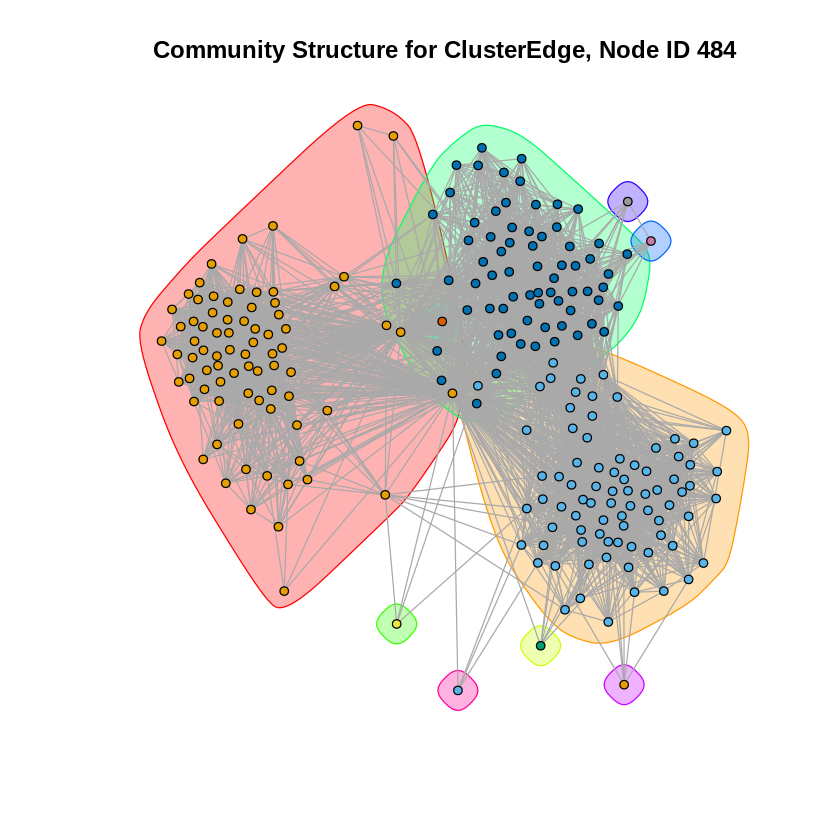

[1] "The Vertex Count 206, Edge Count 7409 for Personalised Network 1087"
[1] "The modularity of graph with greedy algorithm is 0.146"
[1] "The modularity of graph with Edge Betweeness is 0.028"
[1] "The modularity of graph with Infomap is 0.027"


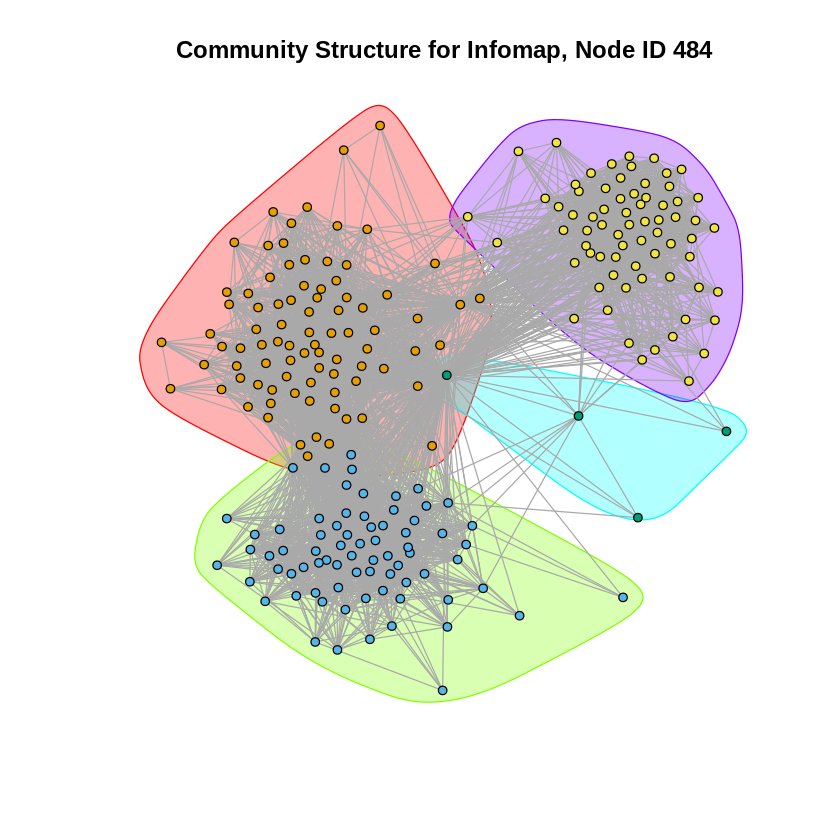

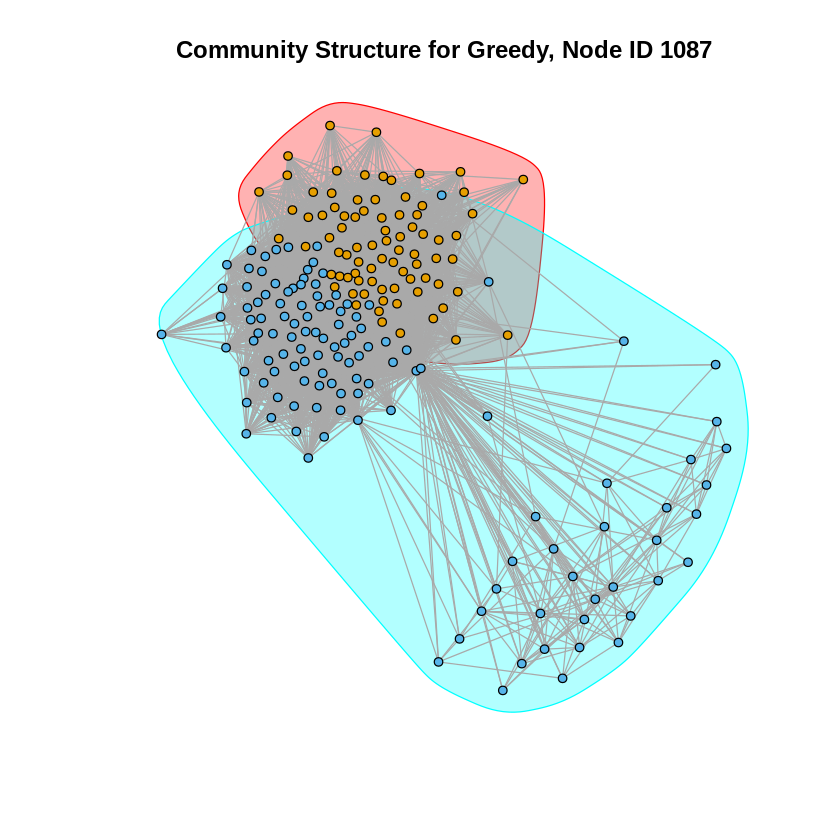

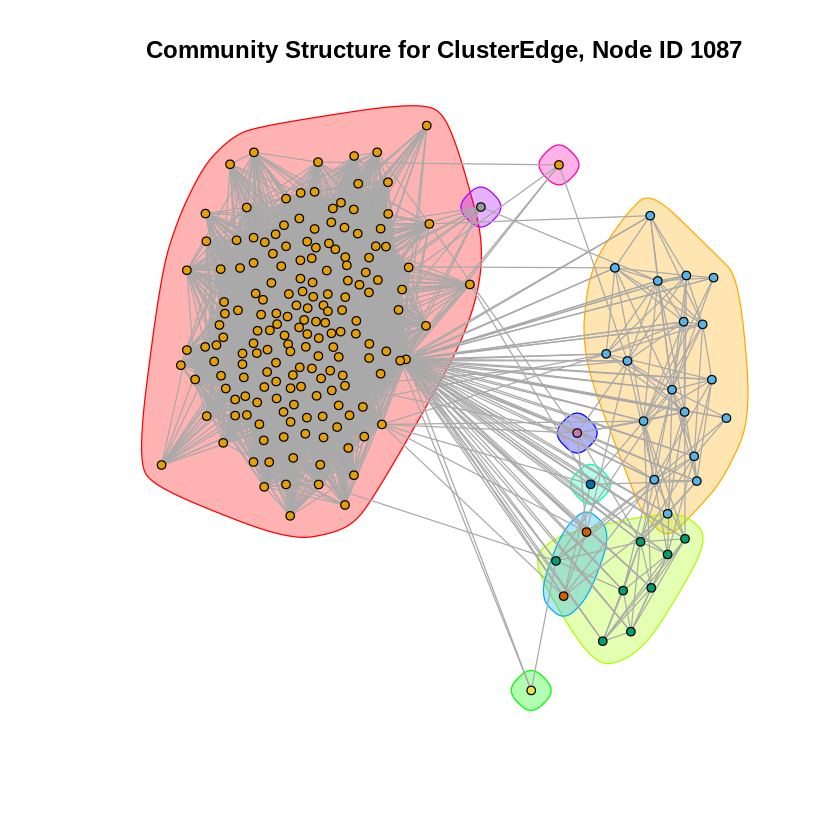

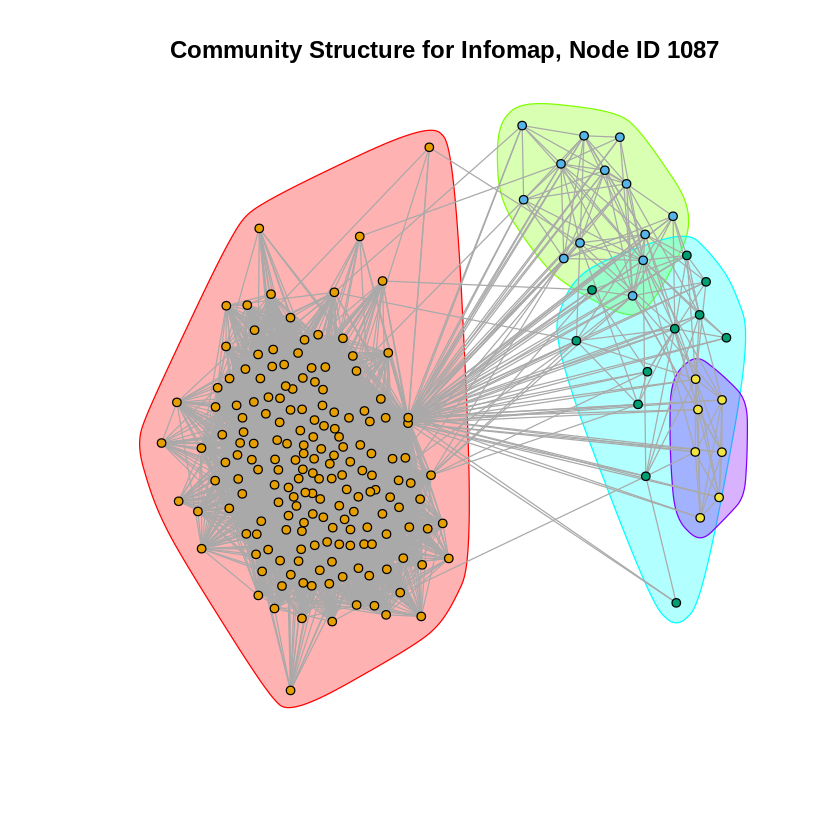

In [ ]:
node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
for(i in 1:length(node_ids))
{
  graph_to_work_on <- graph[[i]]
  
  greedy_cluster <- cluster_fast_greedy(graph_to_work_on)
  cluster_edge <- cluster_edge_betweenness(graph_to_work_on)
  infomap <- cluster_infomap(graph_to_work_on)
  print(sprintf("The Vertex Count %d, Edge Count %d for Personalised Network %d",vcount(graph_to_work_on),ecount(graph_to_work_on),node_ids_for_printing[i]))
  
  print(sprintf("The modularity of graph with greedy algorithm is %0.3f",modularity(greedy_cluster)))
  print(sprintf("The modularity of graph with Edge Betweeness is %0.3f",modularity(cluster_edge)))
  print(sprintf("The modularity of graph with Infomap is %0.3f",modularity(infomap)))



  plot(graph_to_work_on,mark.groups = groups(greedy_cluster),vertex.label=NA,vertex.color =greedy_cluster$membership,vertex.size=3,main=sprintf("Community Structure for Greedy, Node ID %d",node_ids_for_printing[i]))
  
  
  plot(graph_to_work_on,mark.groups = groups(cluster_edge),vertex.label=NA,vertex.color =cluster_edge$membership,vertex.size=3,main=sprintf("Community Structure for ClusterEdge, Node ID %d",node_ids_for_printing[i]))
  
  plot(graph_to_work_on,mark.groups = groups(infomap),vertex.label=NA,vertex.color =infomap$membership,vertex.size=3,main=sprintf("Community Structure for Infomap, Node ID %d",node_ids_for_printing[i]))
}

**Question 10**

[1] "The Vertex Count 347, Edge Count 2519 for Personalised Network 1"
[1] "The modularity of graph with greedy algorithm is 0.442"
[1] "The modularity of graph with Edge Betweeness is 0.416"
[1] "The modularity of graph with Infomap is 0.418"


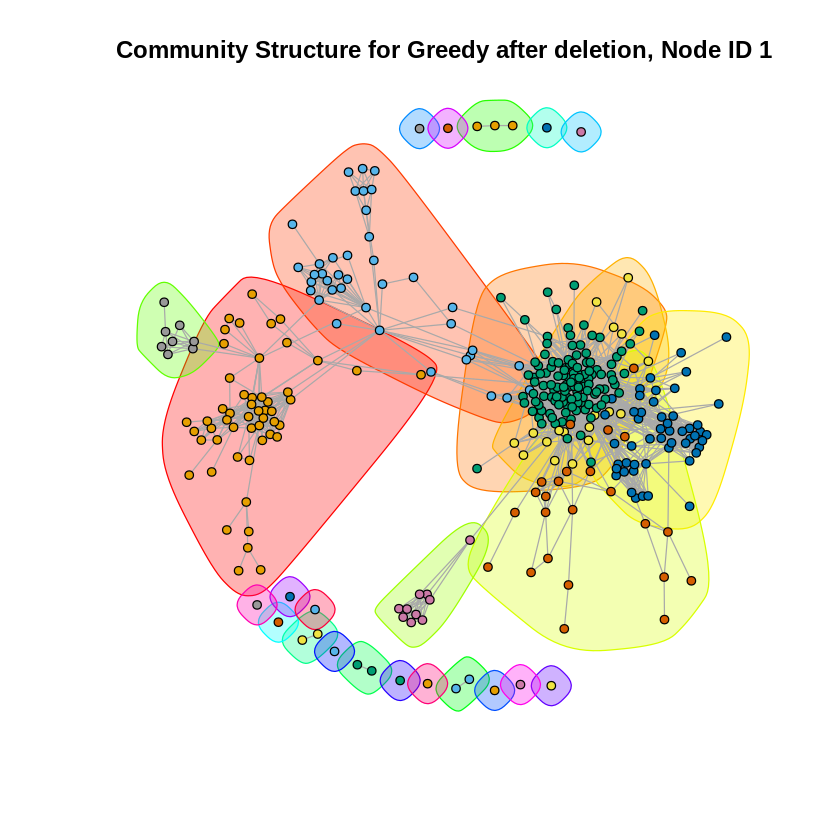

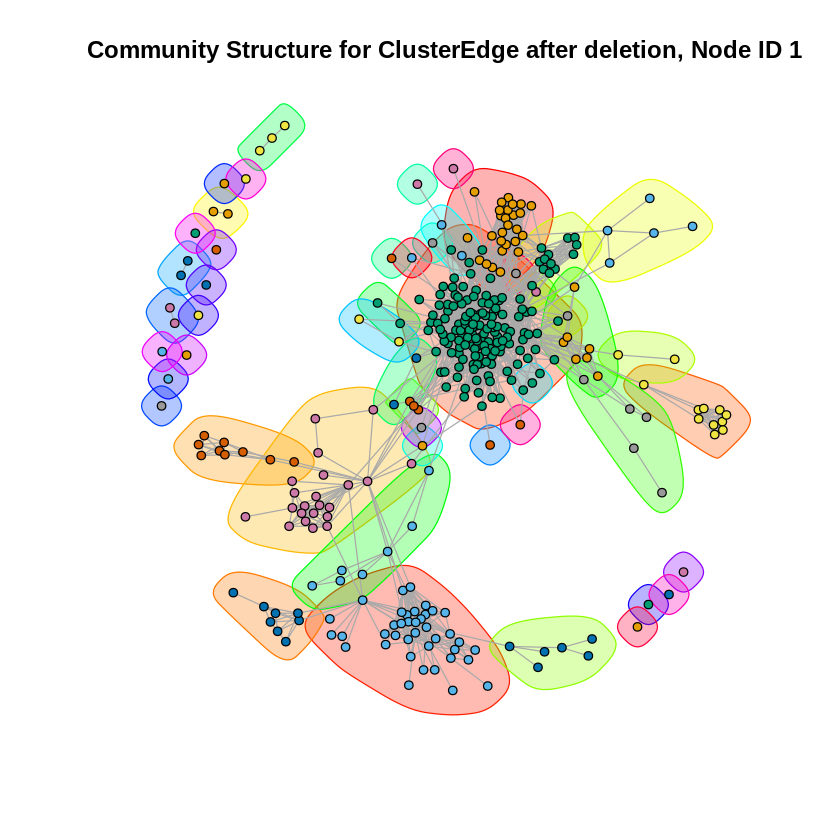

[1] "The Vertex Count 1045, Edge Count 26750 for Personalised Network 108"
[1] "The modularity of graph with greedy algorithm is 0.458"
[1] "The modularity of graph with Edge Betweeness is 0.521"
[1] "The modularity of graph with Infomap is 0.521"


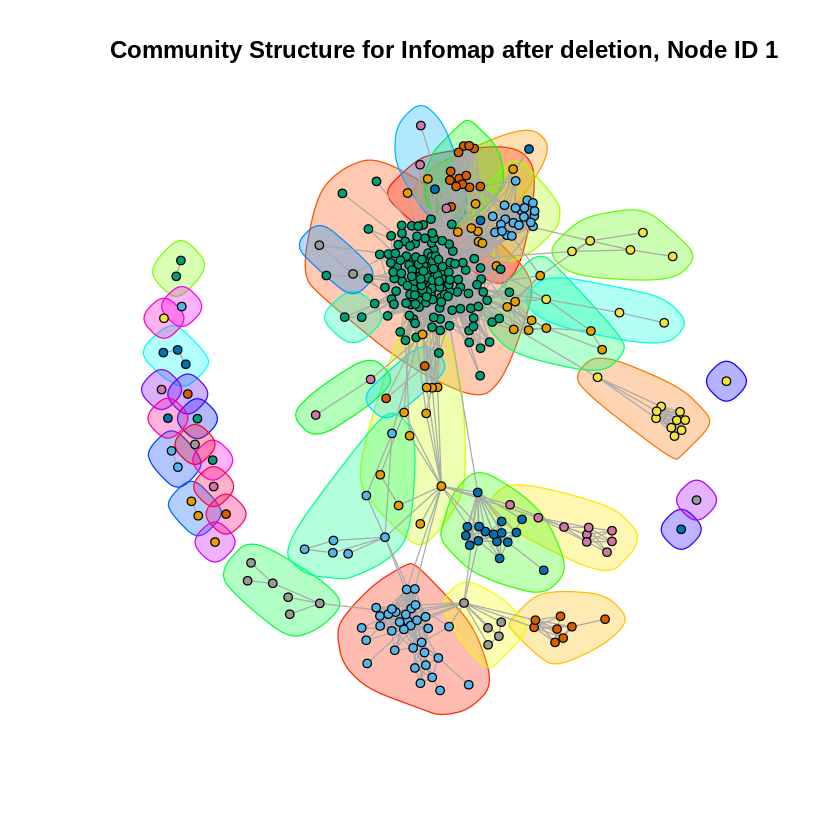

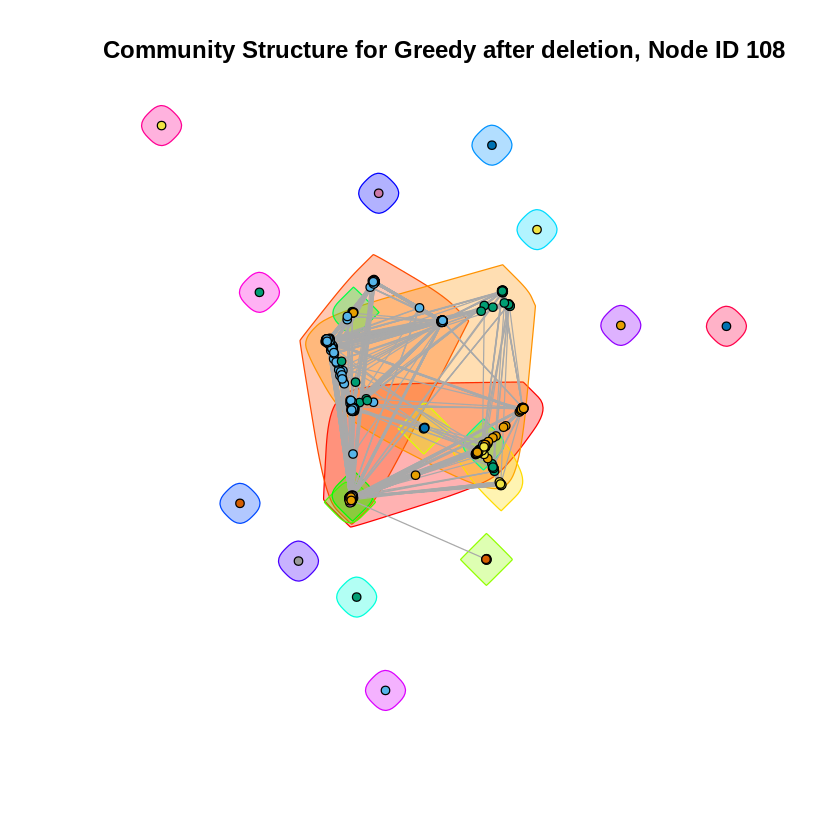

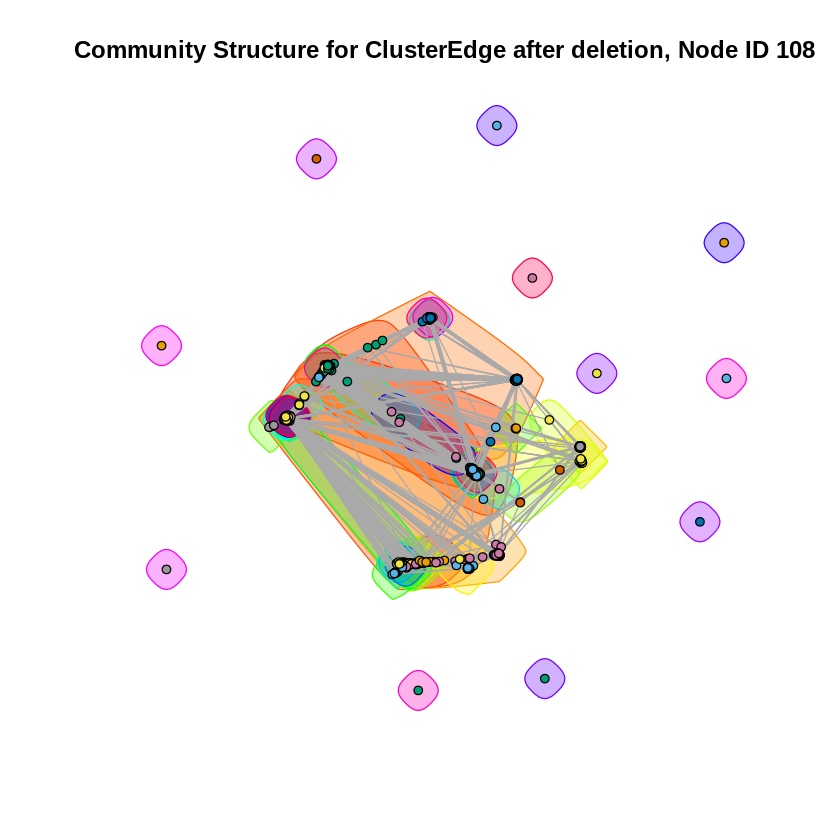

[1] "The Vertex Count 229, Edge Count 3212 for Personalised Network 349"
[1] "The modularity of graph with greedy algorithm is 0.246"
[1] "The modularity of graph with Edge Betweeness is 0.151"
[1] "The modularity of graph with Infomap is 0.247"


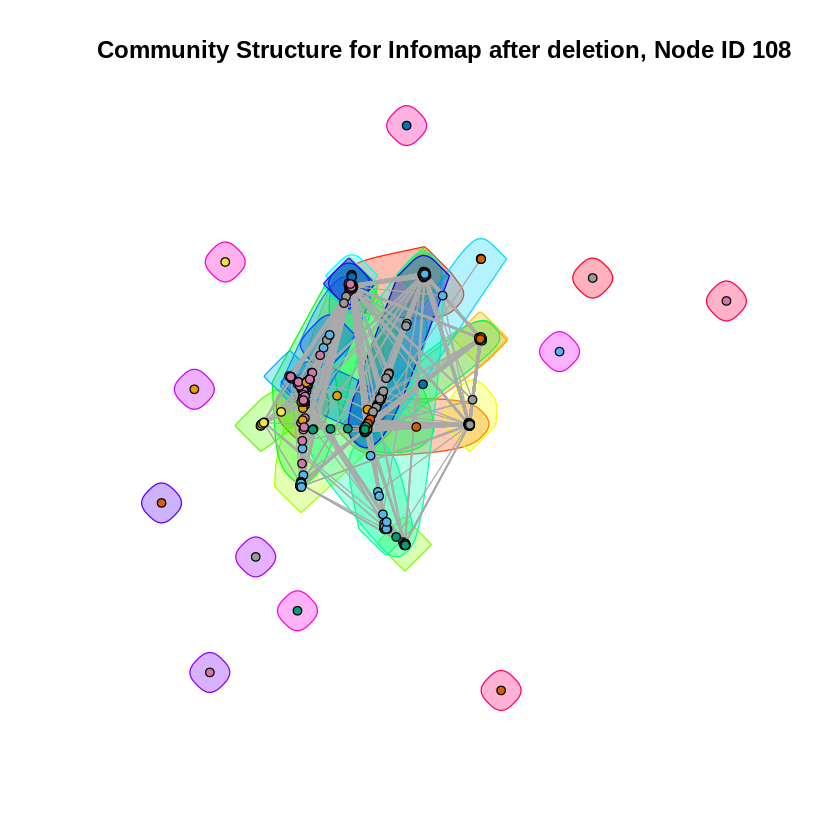

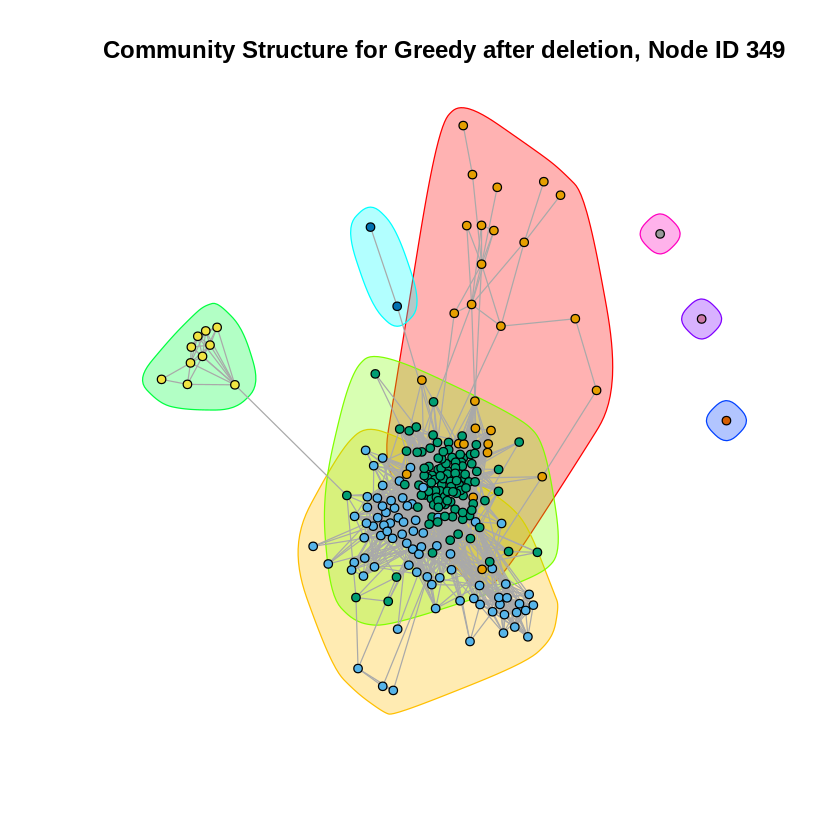

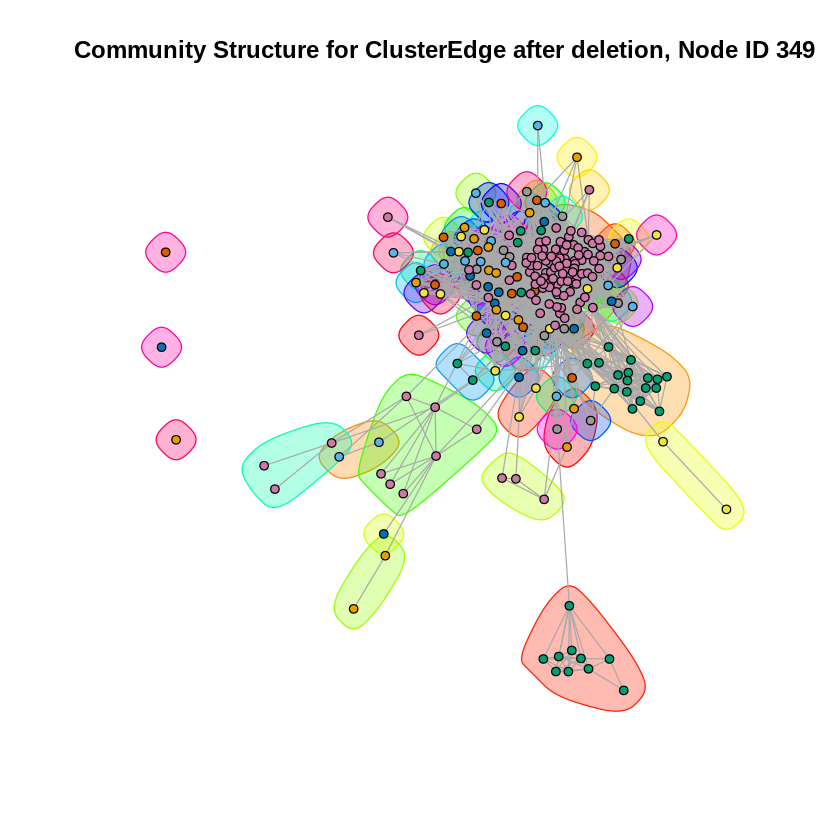

[1] "The Vertex Count 231, Edge Count 4294 for Personalised Network 484"
[1] "The modularity of graph with greedy algorithm is 0.534"
[1] "The modularity of graph with Edge Betweeness is 0.515"
[1] "The modularity of graph with Infomap is 0.543"


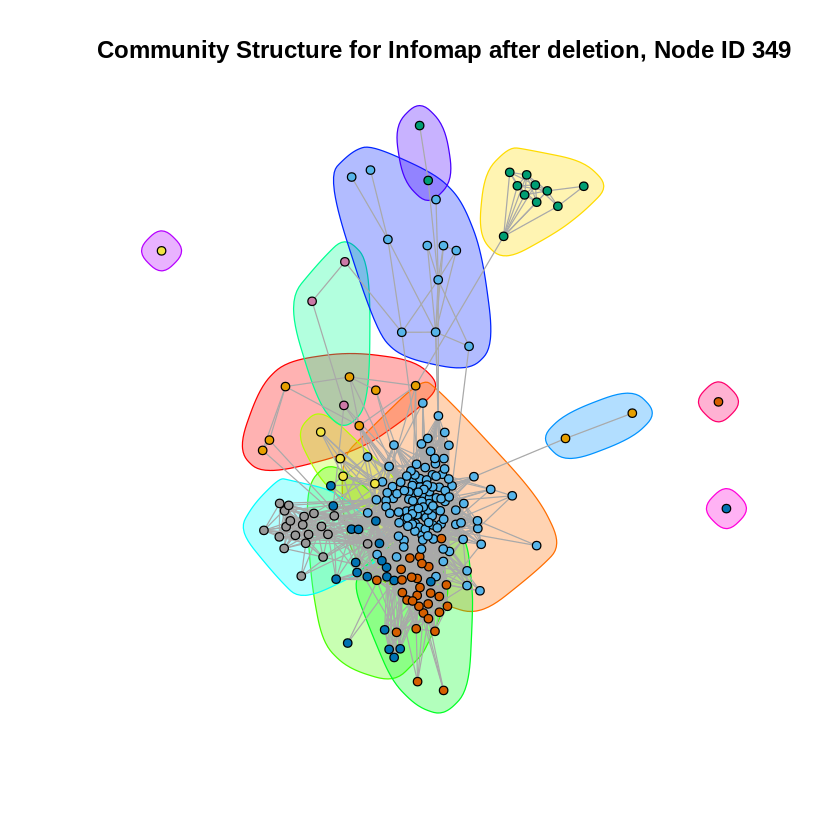

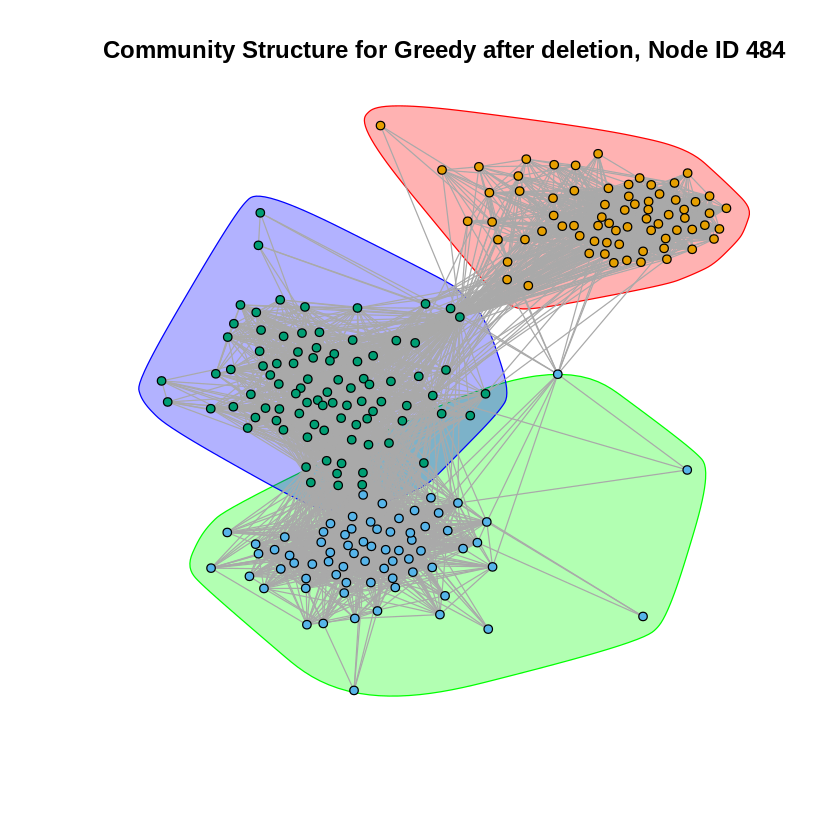

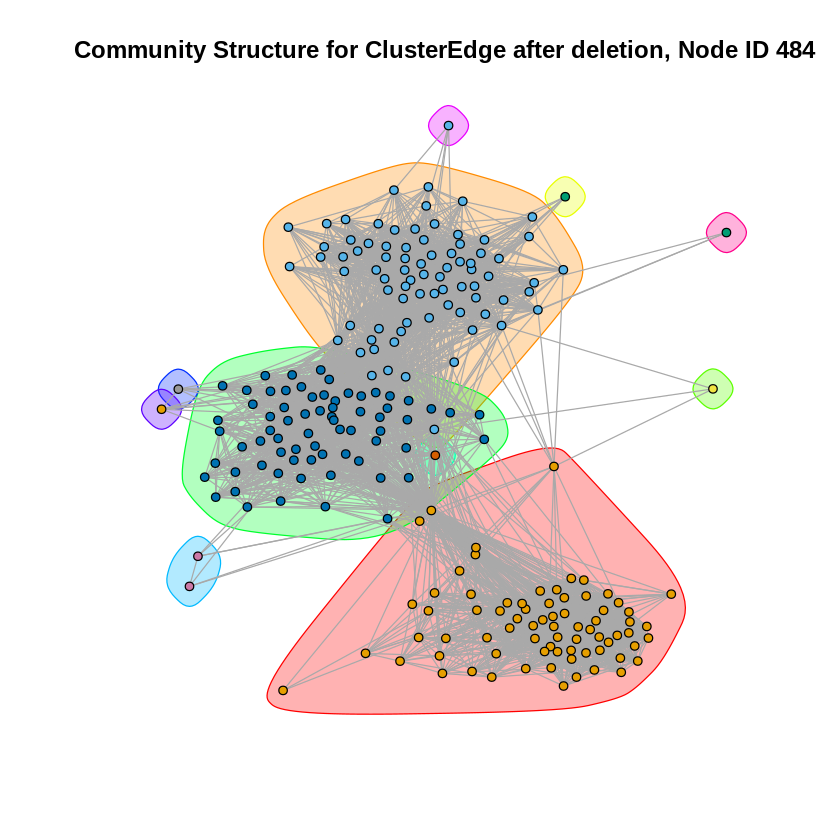

[1] "The Vertex Count 205, Edge Count 7204 for Personalised Network 1087"
[1] "The modularity of graph with greedy algorithm is 0.148"
[1] "The modularity of graph with Edge Betweeness is 0.032"
[1] "The modularity of graph with Infomap is 0.027"


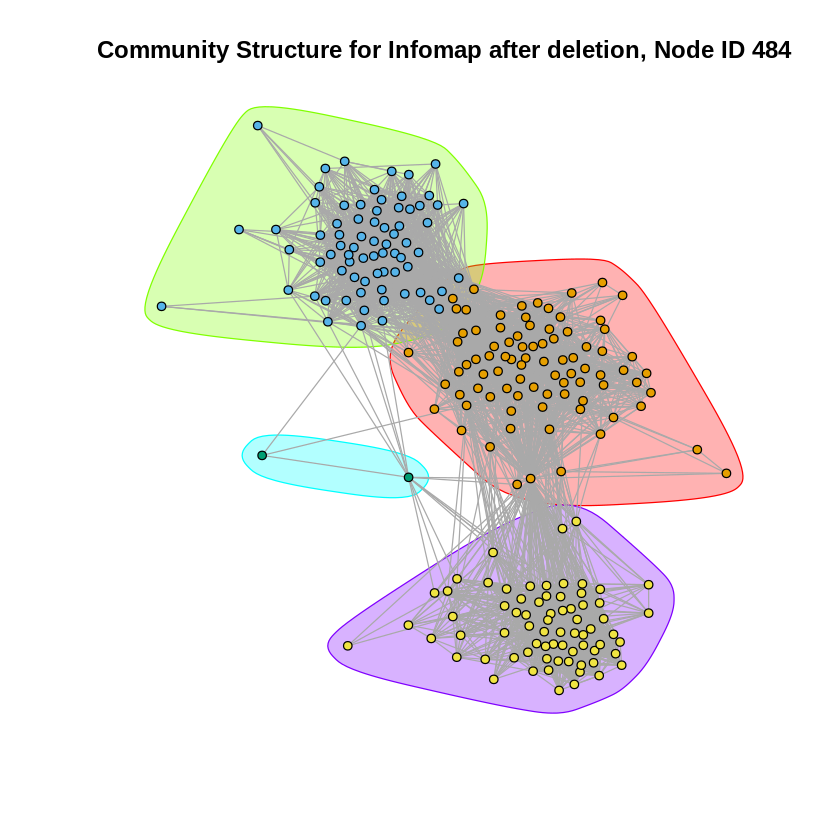

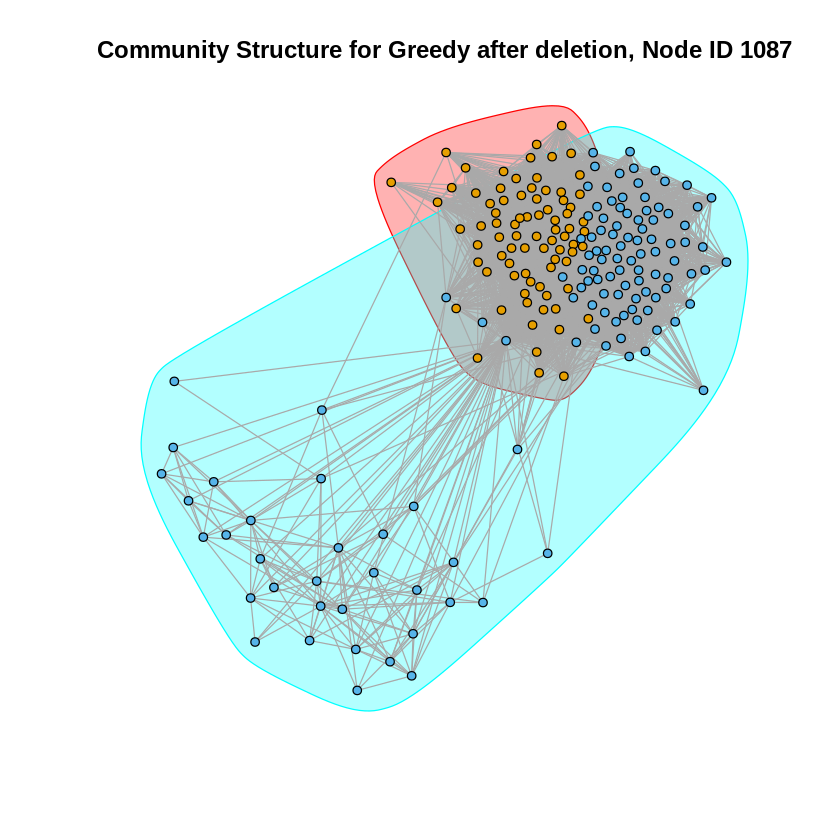

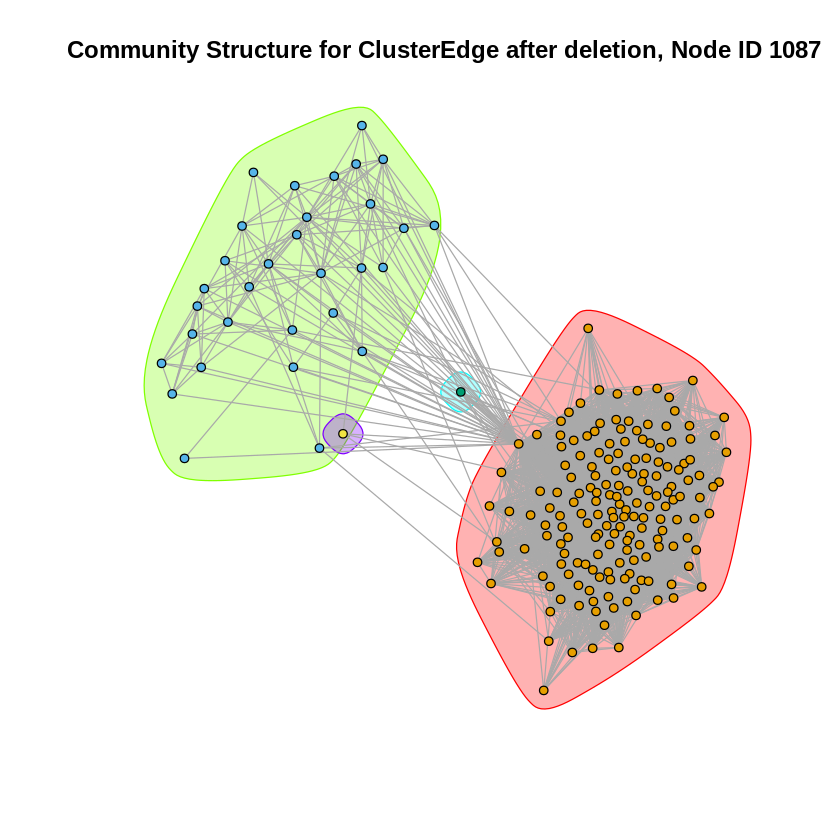

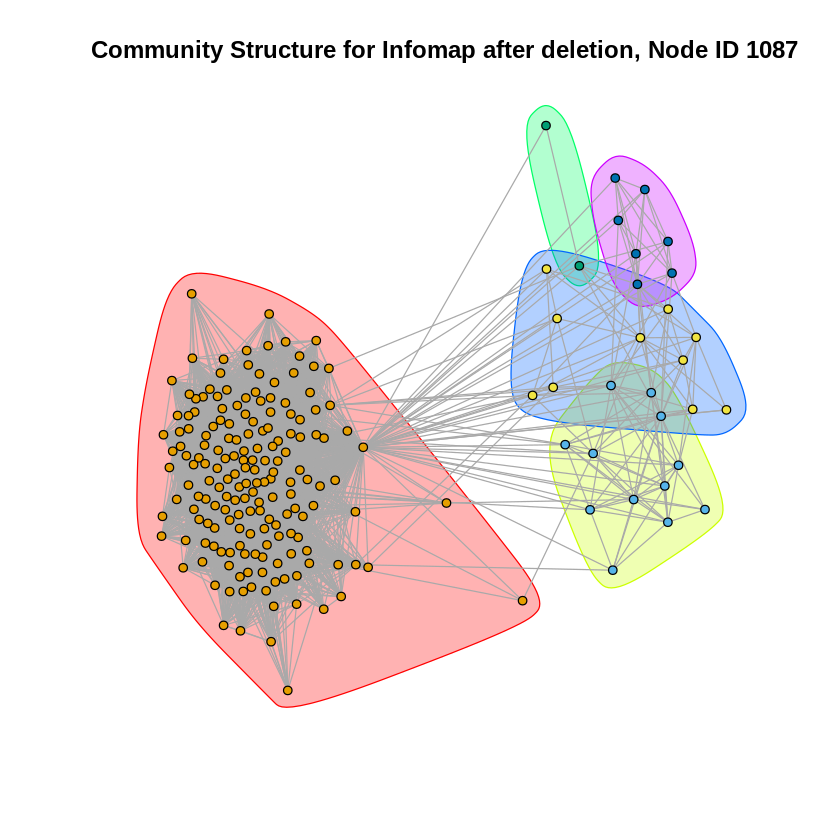

In [ ]:
node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
for(i in 1:length(node_ids))
{
  graph_to_work_on <- graph[[i]]
  graph_to_work_on = delete_vertices(graph_to_work_on,node_ids[i])
  greedy_cluster <- cluster_fast_greedy(graph_to_work_on)
  cluster_edge <- cluster_edge_betweenness(graph_to_work_on)
  infomap <- cluster_infomap(graph_to_work_on)
  print(sprintf("The Vertex Count %d, Edge Count %d for Personalised Network %d",vcount(graph_to_work_on),ecount(graph_to_work_on),node_ids_for_printing[i]))
  
  print(sprintf("The modularity of graph with greedy algorithm is %0.3f",modularity(greedy_cluster)))
  print(sprintf("The modularity of graph with Edge Betweeness is %0.3f",modularity(cluster_edge)))
  print(sprintf("The modularity of graph with Infomap is %0.3f",modularity(infomap)))


  
  plot(graph_to_work_on,mark.groups = groups(greedy_cluster),vertex.label=NA,vertex.color =greedy_cluster$membership,vertex.size=3,main=sprintf("Community Structure for Greedy after deletion, Node ID %d",node_ids_for_printing[i]))
  
  
  plot(graph_to_work_on,mark.groups = groups(cluster_edge),vertex.label=NA,vertex.color =cluster_edge$membership,vertex.size=3,main=sprintf("Community Structure for ClusterEdge after deletion, Node ID %d",node_ids_for_printing[i]))
  
  
  plot(graph_to_work_on,mark.groups = groups(infomap),vertex.label=NA,vertex.color =infomap$membership,vertex.size=3,main=sprintf("Community Structure for Infomap after deletion, Node ID %d",node_ids_for_printing[i]))
}

**Question 12 & 13**

In [ ]:
embedded = function(G,vertex)
{
  return (degree(G,vertex)-1)
}

disp = function(G,vertex_c,vertex_i)
{
  dispersion <- 0
  mutual_friends = intersection(neighbors(G,vertex_c),neighbors(G,vertex_i))
  mutual_friends = mutual_friends$name
  updated_graph <- delete_vertices(G,c(vertex_c,vertex_i))
  dist = distances(updated_graph,v=mutual_friends,to= mutual_friends)
  dist[is.infinite(dist)]=0
  return (sum(dist))
}

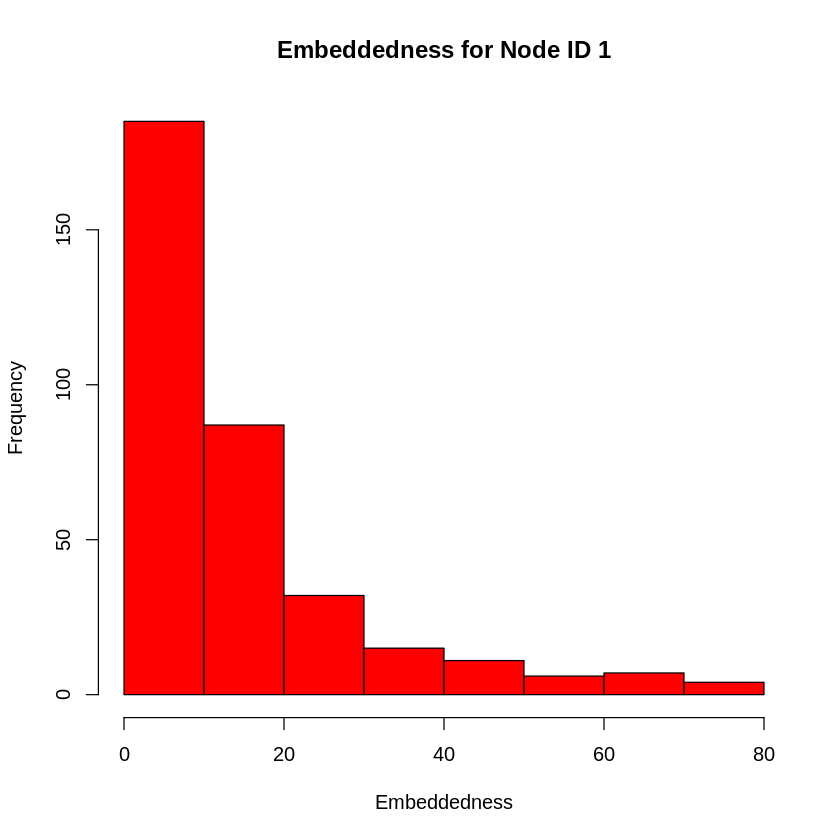

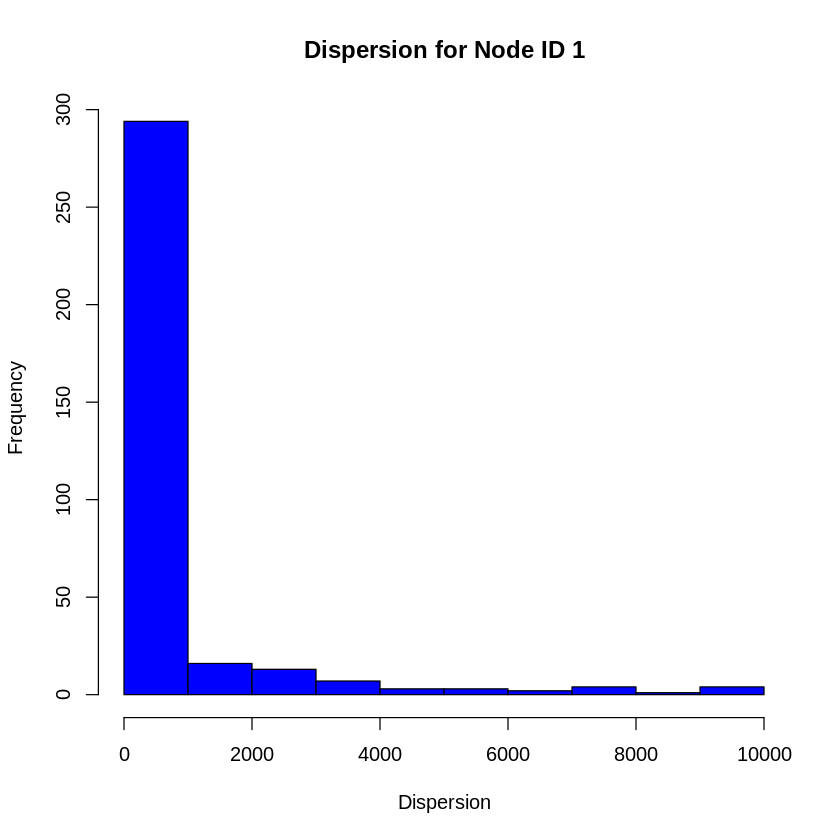

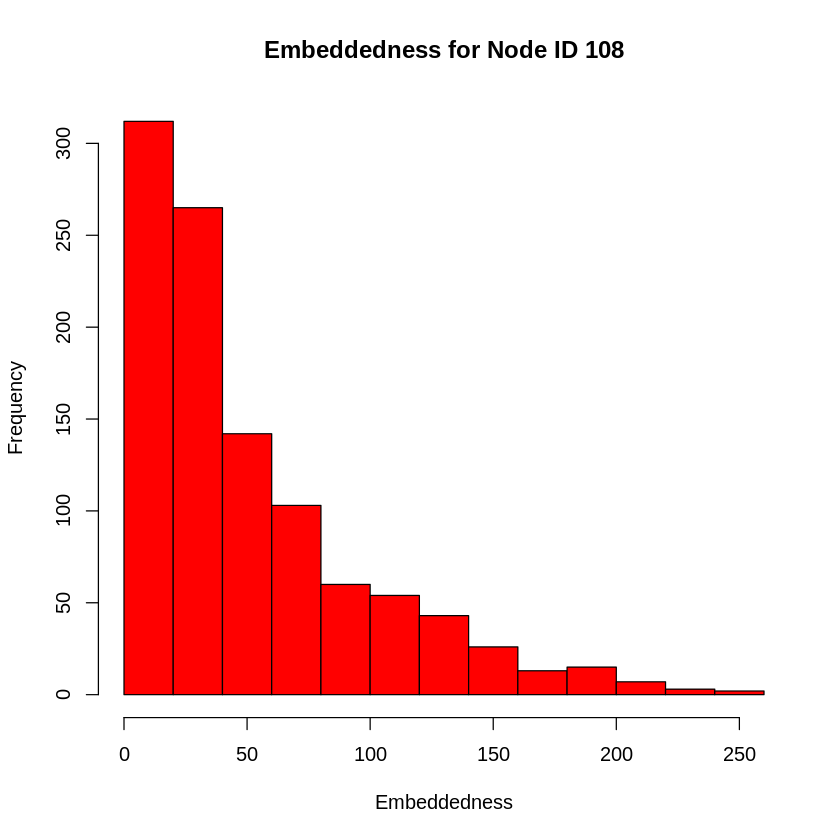

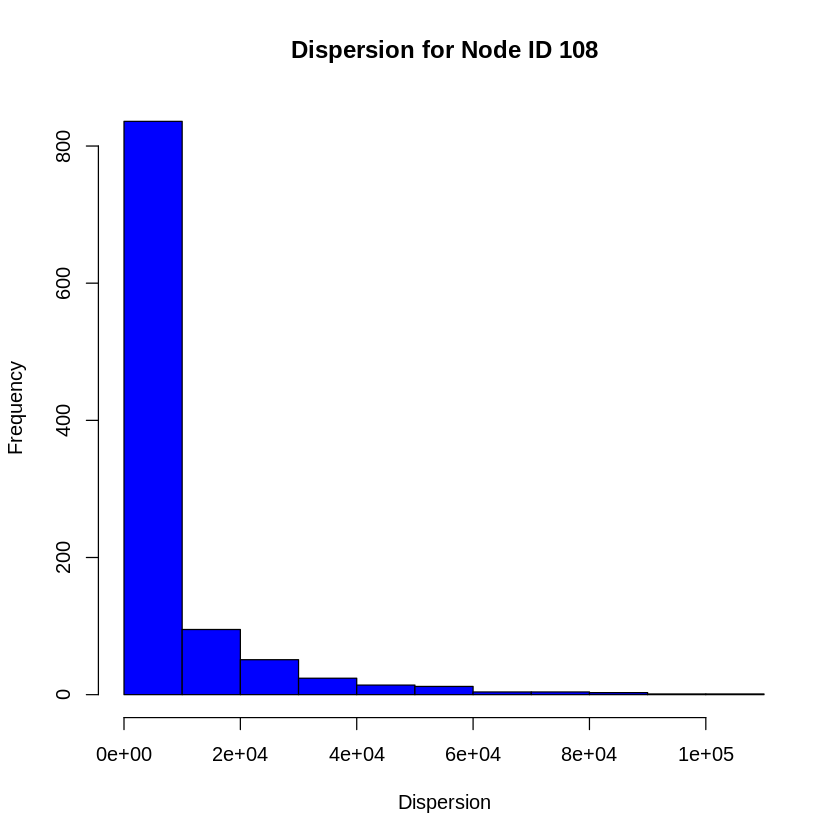

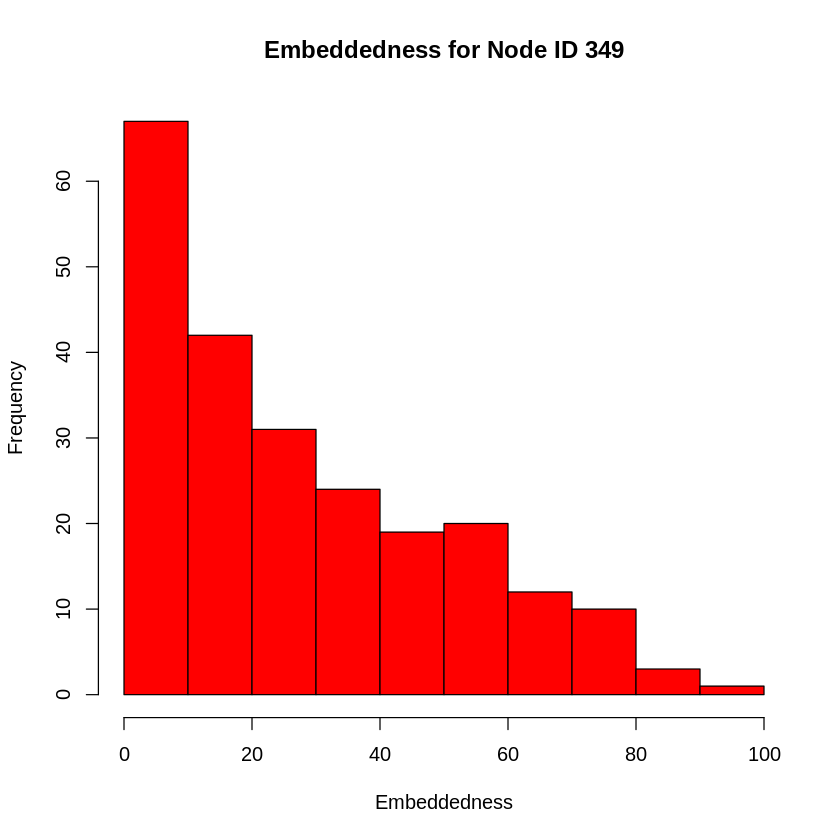

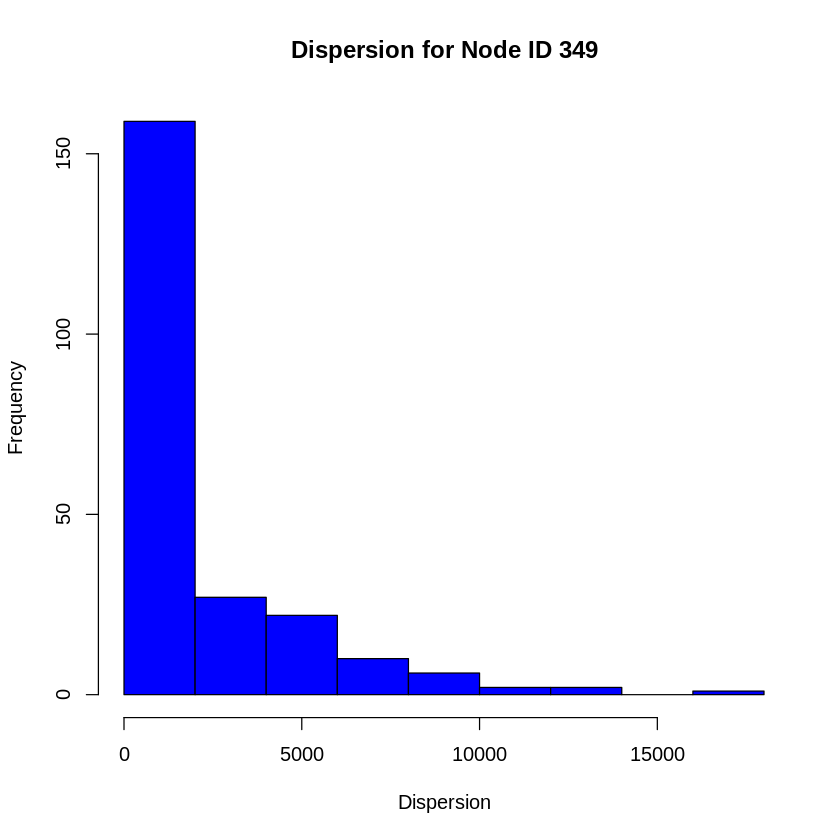

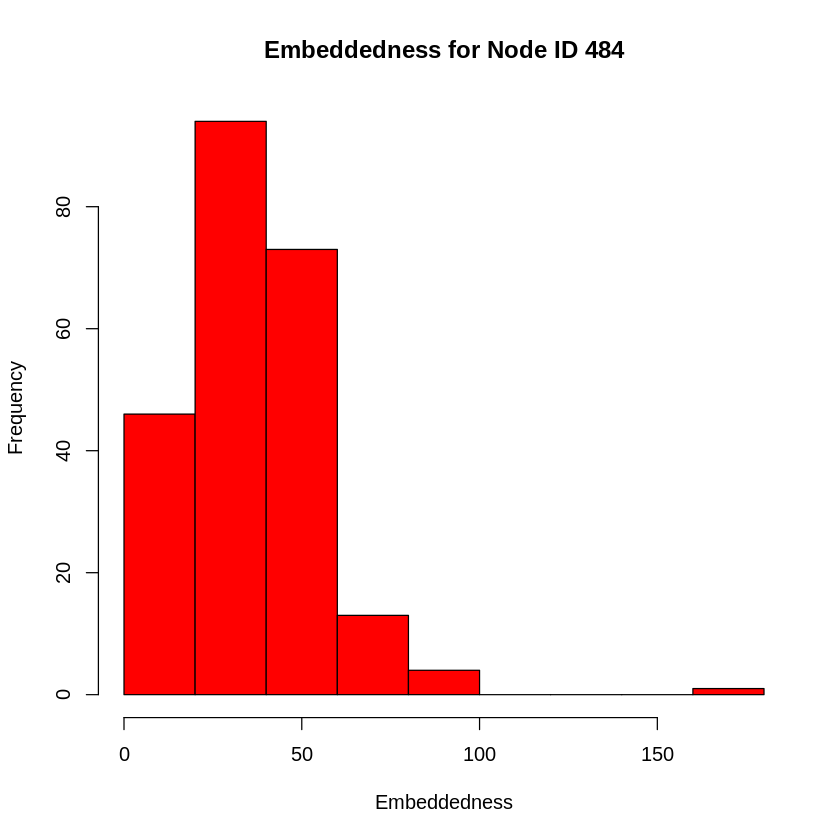

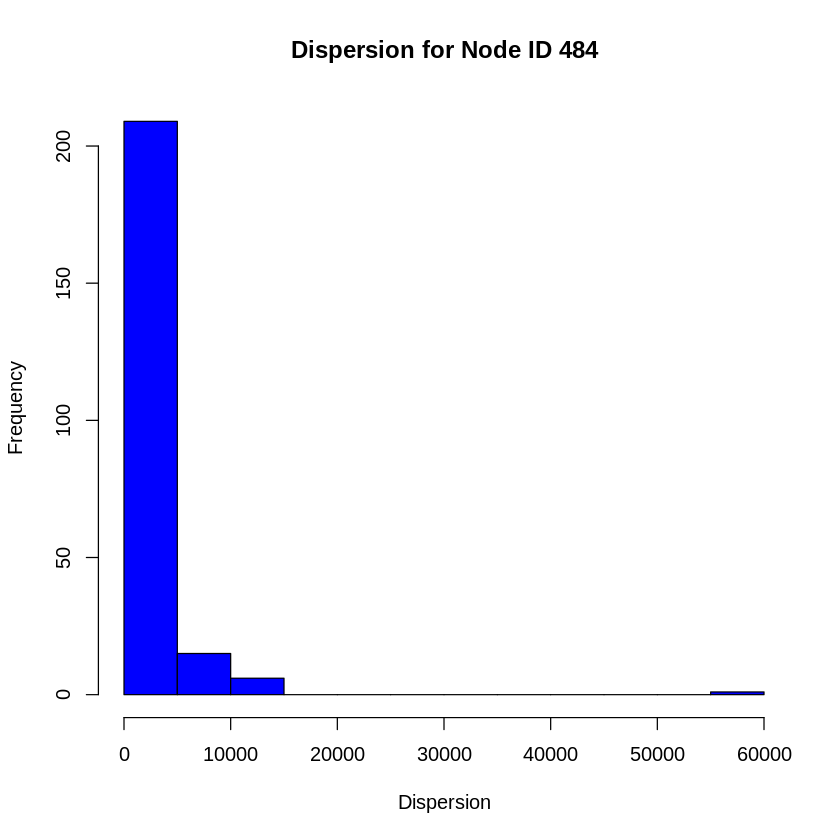

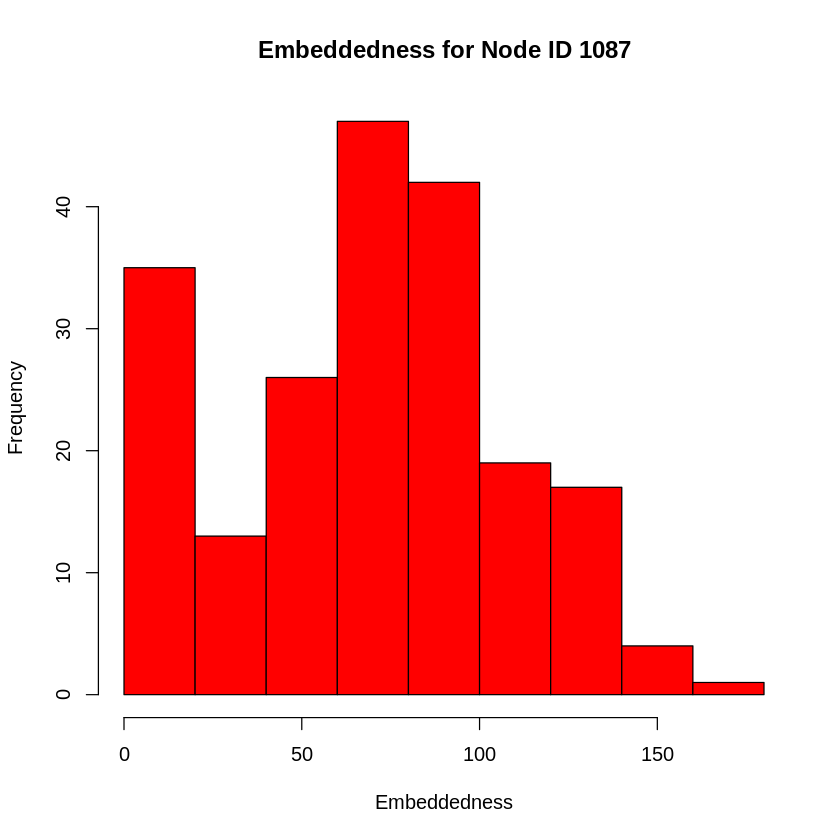

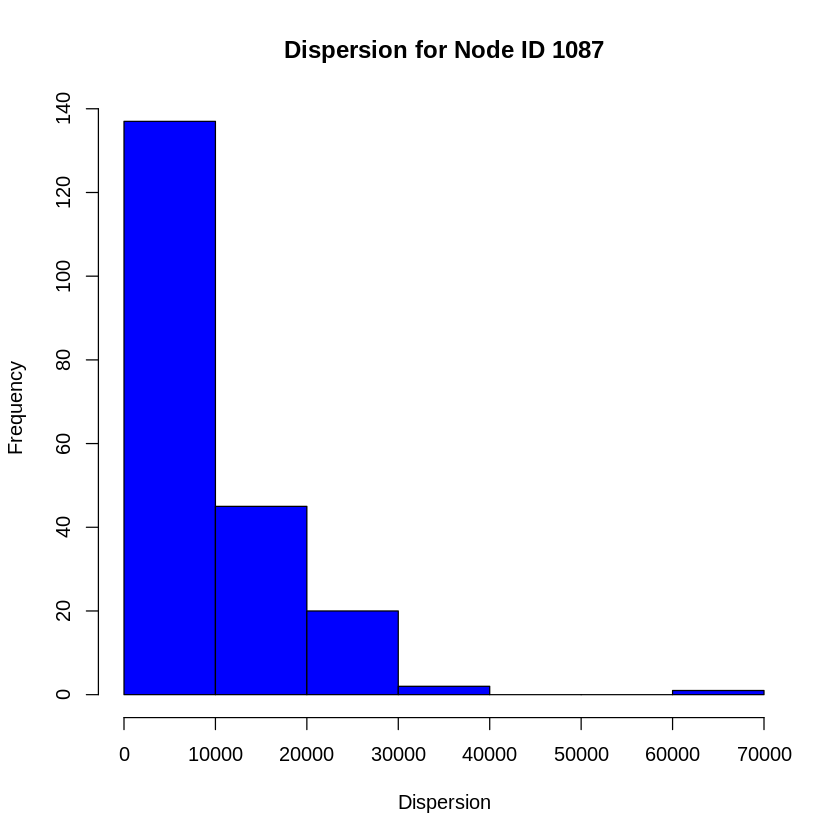

In [ ]:

node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
max_dispersion_node <- c() ## For Question 13
max_embeddedness_node <-c() ## For Question 14
max_disp_embeddedness_node <-c()
for(i in 1:length(node_ids))
{
  graph_to_work_on <- graph[[i]]
  vertices_inside = V(graph_to_work_on)$name
  embeddedness = c()
  dispersion = c()
  max_disp <-0
  disp_n <-NA

  max_embed <- 0 
  embed_n <- NA

  max_disp_embed <- 0 
  disp_embed_n <- NA
  for(j in 1:length(vertices_inside))
  {
    embeddedness =c(embeddedness,embedded(graph_to_work_on,vertices_inside[j]))
    dispersion = c(dispersion,disp(graph_to_work_on,node_ids[i],vertices_inside[j]))

    current_embed = embeddedness[length(embeddedness)]
    current_dispersion = dispersion[length(dispersion)]
    if((current_dispersion>max_disp) && (vertices_inside[j]!=node_ids[i]))
    {
      max_disp<-current_dispersion
      disp_n <- vertices_inside[j]
    }

    if((current_embed>max_embed) && (vertices_inside[j]!=node_ids[i]))
    {
      max_embed<-current_embed
      embed_n <- vertices_inside[j]
    }

    ratio_val <- current_dispersion/current_embed
    if(is.nan(ratio_val))
    {
      ratio_val<-0
    }
    if((ratio_val>max_disp_embed)&&(vertices_inside[j]!=node_ids[i]))
      {
        max_disp_embed <-ratio_val
        disp_embed_n <-vertices_inside[j]
      }


  }
  embeddedness = embeddedness[embeddedness<max(embeddedness)]
  dispersion= dispersion[dispersion<max(dispersion)] 
  max_dispersion_node<-c(max_dispersion_node,disp_n)
  max_embeddedness_node <-c(max_embeddedness_node,embed_n)
  max_disp_embeddedness_node <- c(max_disp_embeddedness_node,disp_embed_n)
  hist(embeddedness,col='red',xlab='Embeddedness',ylab='Frequency',main=sprintf("Embeddedness for Node ID %d",node_ids_for_printing[i]))
  hist(dispersion,col='blue',xlab='Dispersion',ylab='Frequency',main=sprintf("Dispersion for Node ID %d",node_ids_for_printing[i]))
}

In [ ]:
max_dispersion_node

[1] "56"   "1888" "376"  "107"  "107"

In [ ]:
max_embeddedness_node

[1] "56"   "1888" "376"  "107"  "107"

**Question 13**

In [ ]:
max_disp_embeddedness_node

[1] "25"   "1888" "376"  "107"  "107"

[1] "Node with maximum dispersion for Node ID: 1 is 56"


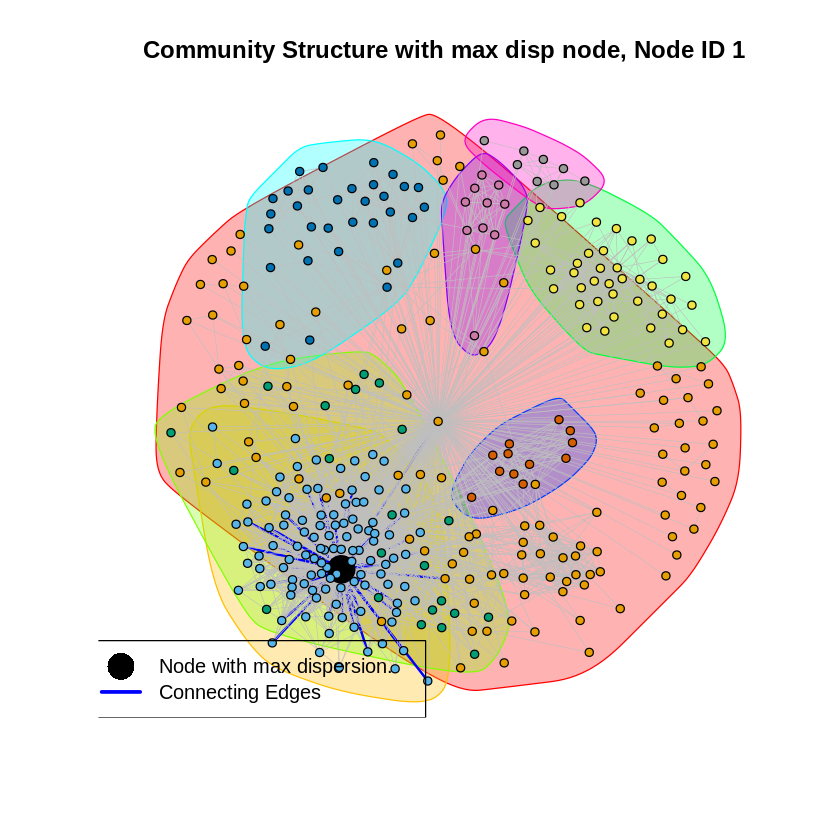

[1] "Node with maximum dispersion for Node ID: 108 is 1888"


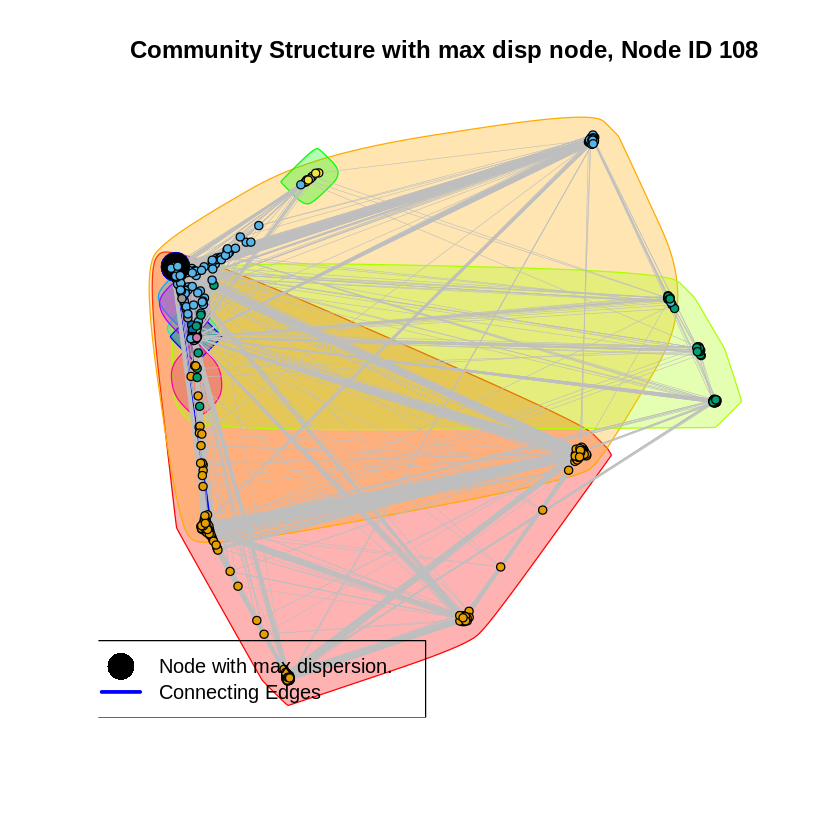

[1] "Node with maximum dispersion for Node ID: 349 is 376"


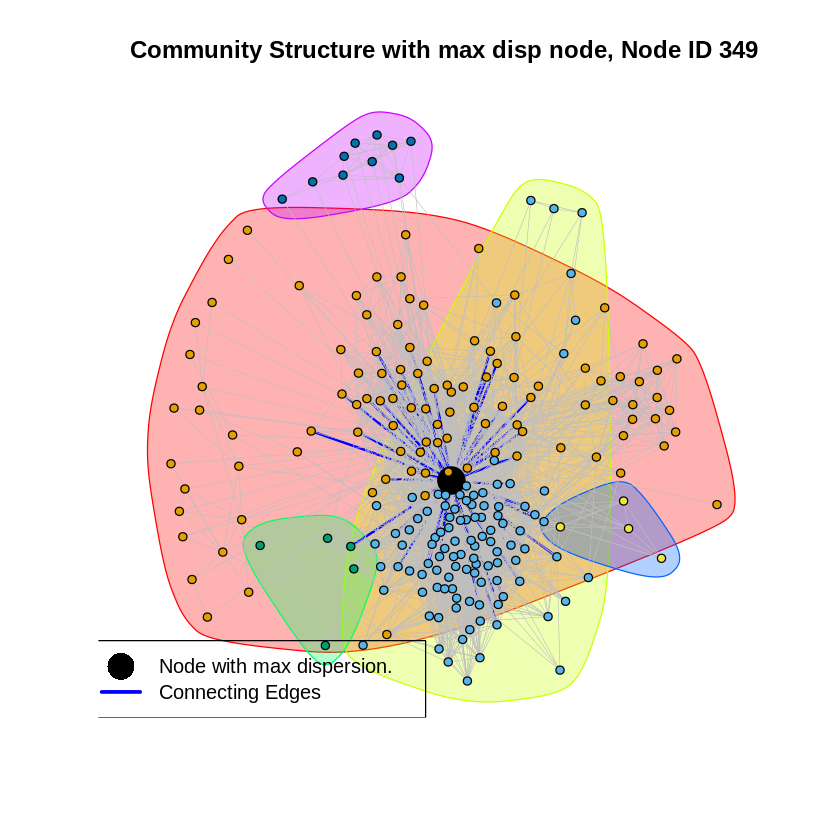

[1] "Node with maximum dispersion for Node ID: 484 is 107"


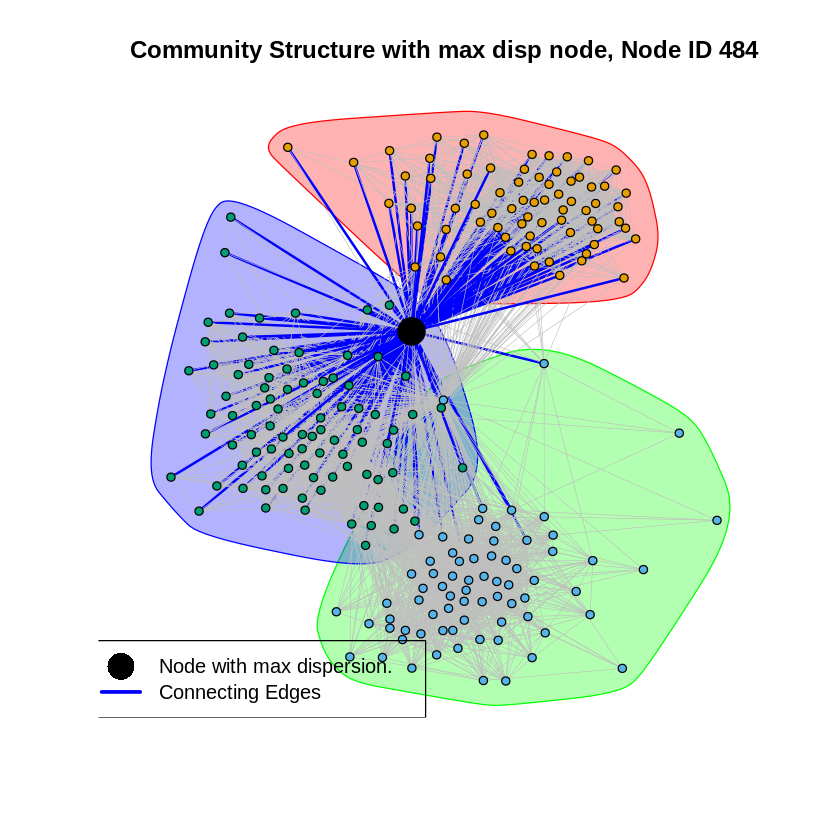

[1] "Node with maximum dispersion for Node ID: 1087 is 107"


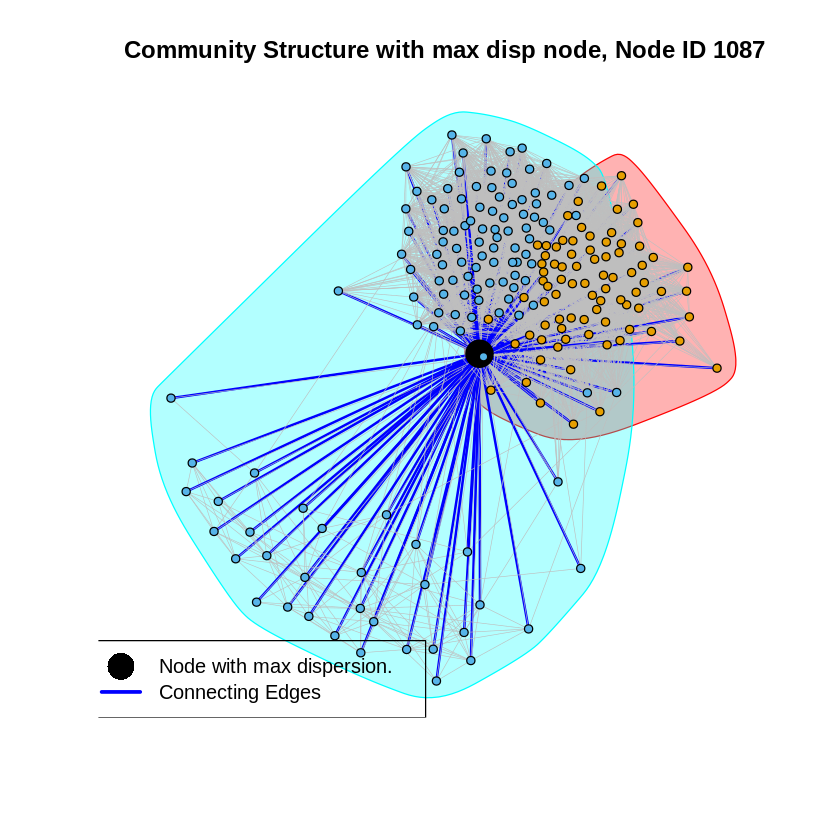

In [ ]:
node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
for(i in 1:length(node_ids))
{
  mx_node <- max_dispersion_node[i]
  graph_to_work_on <-graph[[i]]
  community <- cluster_fast_greedy(graph_to_work_on)
  vertex_col = rep(community$membership,vcount(graph_to_work_on))
  vertex_col[which(V(graph_to_work_on)$name == mx_node)] = "black";
    
  vertex_size = rep(3,vcount(graph_to_work_on))
  vertex_size[which(V(graph_to_work_on)$name == mx_node)]=10
  edge_color <- rep("gray",ecount(graph_to_work_on))
  el_list <- get.edgelist(graph_to_work_on,name=TRUE)
  edge_color[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]='blue'
  edge_width <- rep(0.5,ecount(graph_to_work_on))
  edge_width[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]=2
  plot(graph_to_work_on,mark.groups= groups(community), edge.arrow.size=0.5,vertex.color=vertex_col,vertex.size = vertex_size,edge.width = edge_width,edge.color=edge_color,vertex.label=NA)
  title(sprintf("Community Structure with max disp node, Node ID %d",node_ids_for_printing[i]))
  legend('bottomleft',legend = c("Node with max dispersion.", "Connecting Edges"),bg="transparent",lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),col = c('black','blue'), pt.cex=3)
  print(sprintf("Node with maximum dispersion for Node ID: %d is %s",node_ids_for_printing[i],mx_node))
}

**Question 14**

[1] "Node with maximum embeddedness for Node ID: 1 is 56"


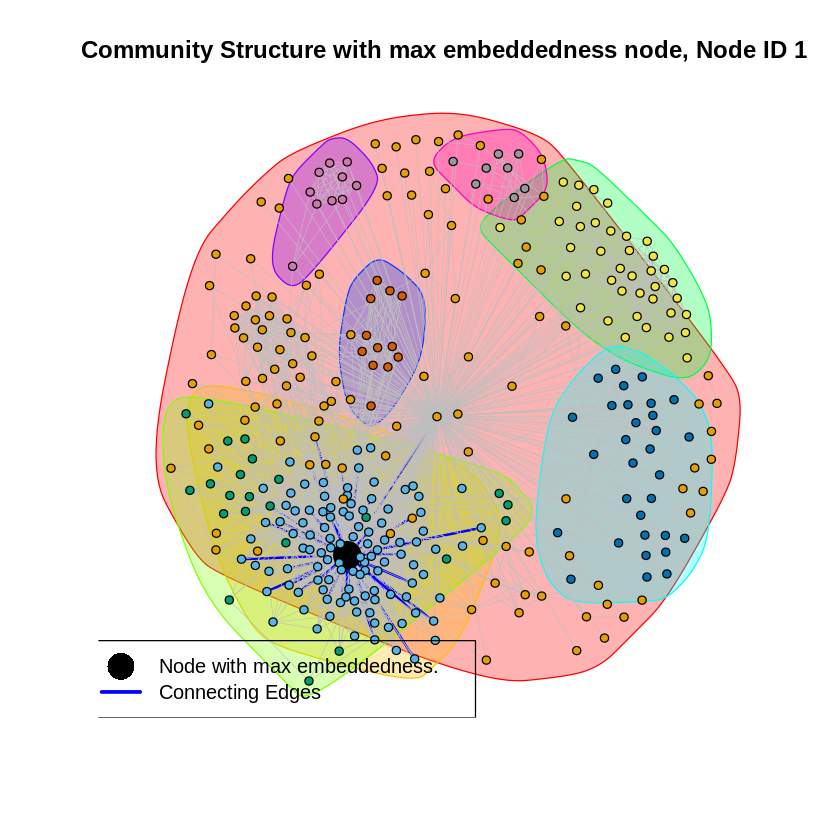

[1] "Node with maximum embeddedness for Node ID: 108 is 1888"


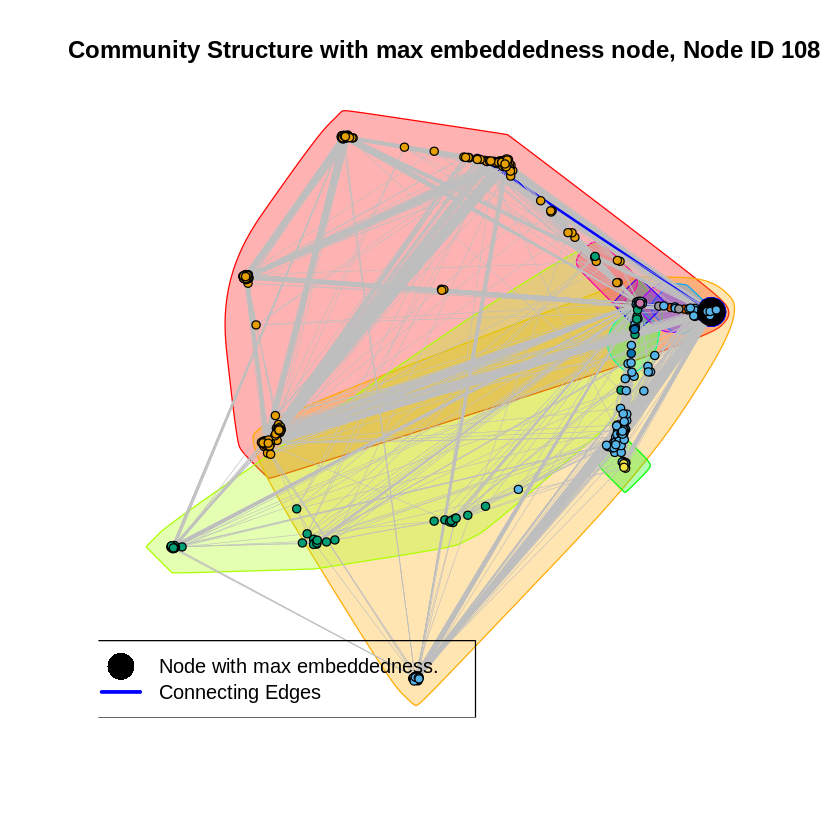

[1] "Node with maximum embeddedness for Node ID: 349 is 376"


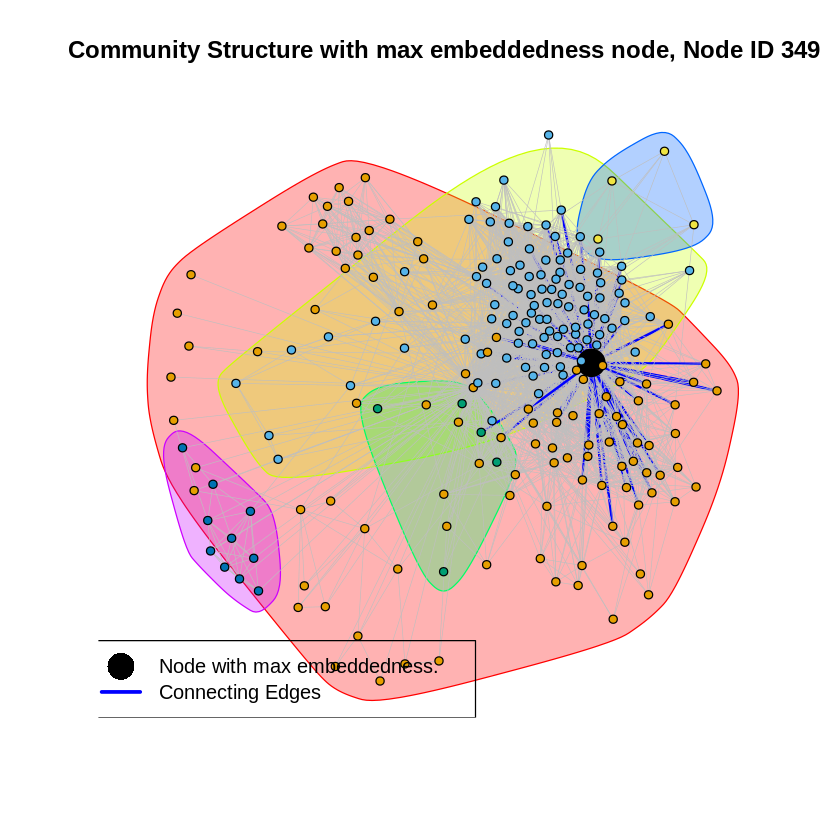

[1] "Node with maximum embeddedness for Node ID: 484 is 107"


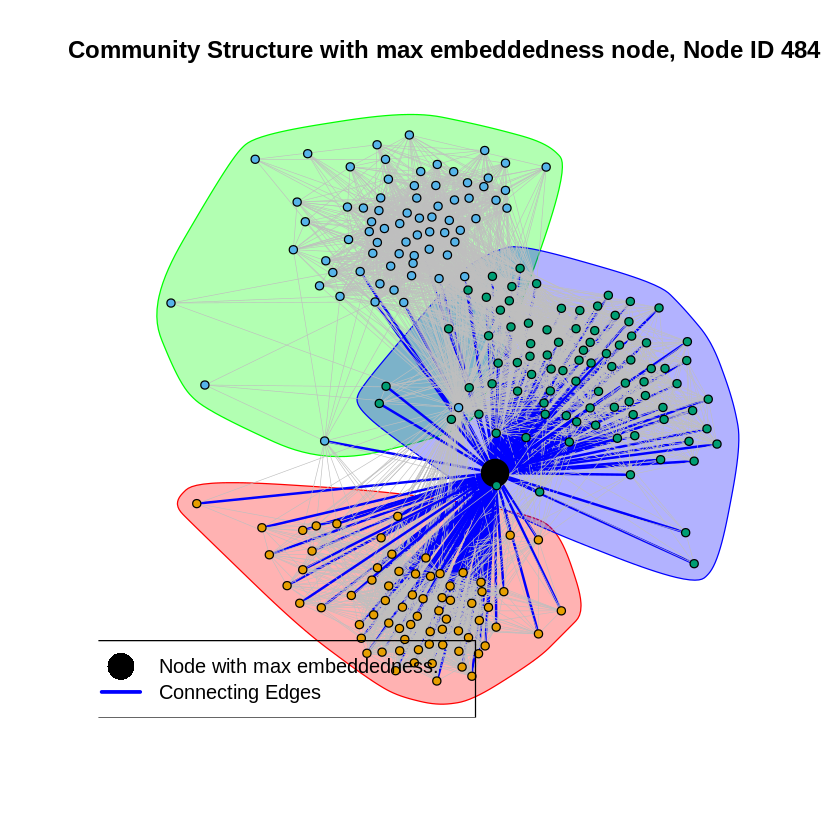

[1] "Node with maximum embeddedness for Node ID: 1087 is 107"


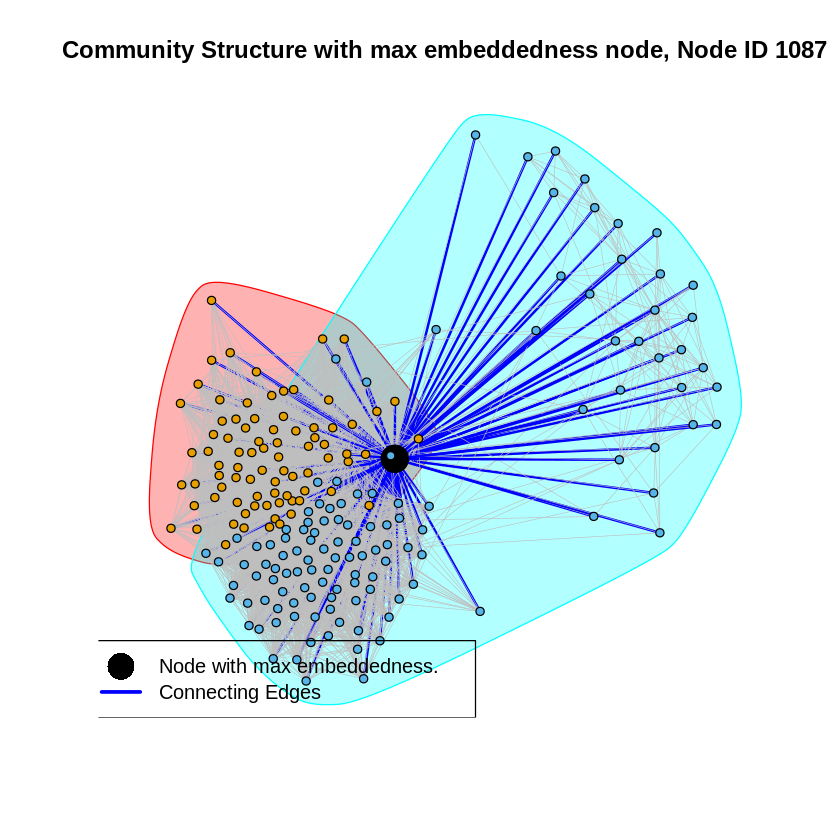

In [ ]:
node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
for(i in 1:length(node_ids))
{
  mx_node <- max_embeddedness_node[i]
  graph_to_work_on <-graph[[i]]
  community <- cluster_fast_greedy(graph_to_work_on)
  vertex_col = rep(community$membership,vcount(graph_to_work_on))
  vertex_col[which(V(graph_to_work_on)$name == mx_node)] = "black";
    
  vertex_size = rep(3,vcount(graph_to_work_on))
  vertex_size[which(V(graph_to_work_on)$name == mx_node)]=10
  edge_color <- rep("gray",ecount(graph_to_work_on))
  el_list <- get.edgelist(graph_to_work_on,name=TRUE)
  edge_color[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]='blue'
  edge_width <- rep(0.5,ecount(graph_to_work_on))
  edge_width[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]=2
  plot(graph_to_work_on,mark.groups= groups(community), edge.arrow.size=0.5,vertex.color=vertex_col,vertex.size = vertex_size,edge.width = edge_width,edge.color=edge_color,vertex.label=NA)
  title(sprintf("Community Structure with max embeddedness node, Node ID %d",node_ids_for_printing[i]))
  legend('bottomleft', bg="transparent",legend = c("Node with max embeddedness.", "Connecting Edges"),lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),col = c('black','blue'), pt.cex=3)
  print(sprintf("Node with maximum embeddedness for Node ID: %d is %s",node_ids_for_printing[i],mx_node))
}

[1] "Node with maximum dispersion/embeddedness ratio for Node ID: 1 is 25"


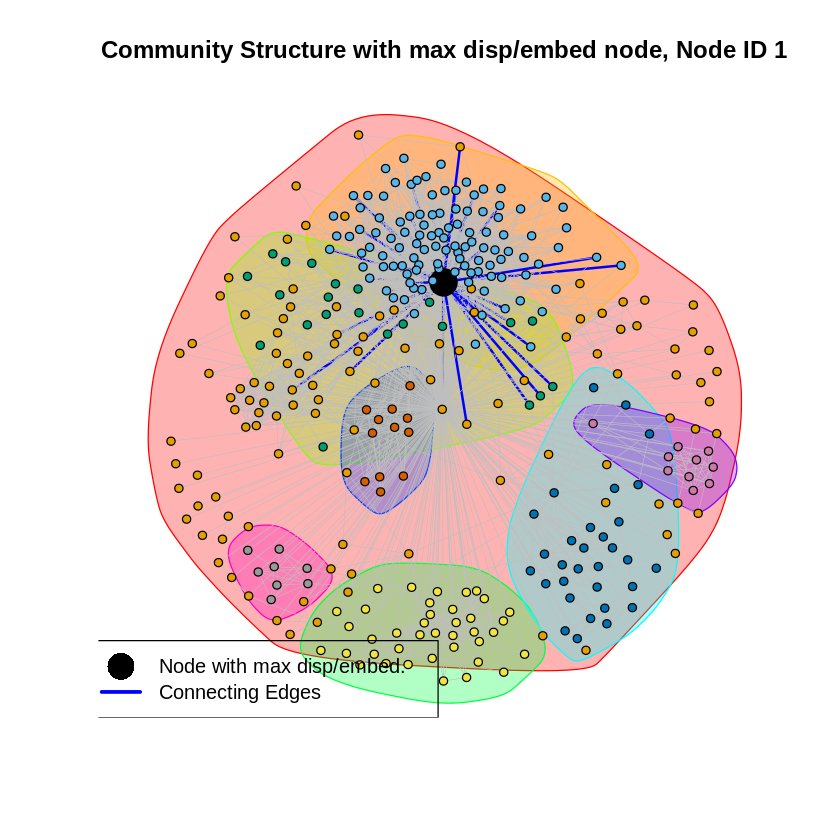

[1] "Node with maximum dispersion/embeddedness ratio for Node ID: 108 is 1888"


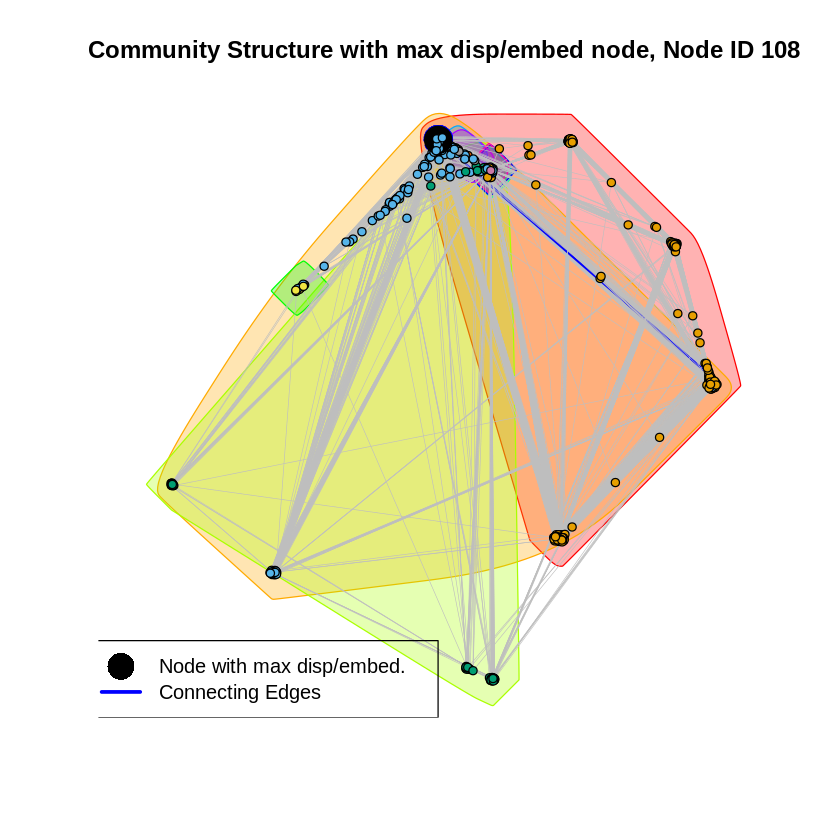

[1] "Node with maximum dispersion/embeddedness ratio for Node ID: 349 is 376"


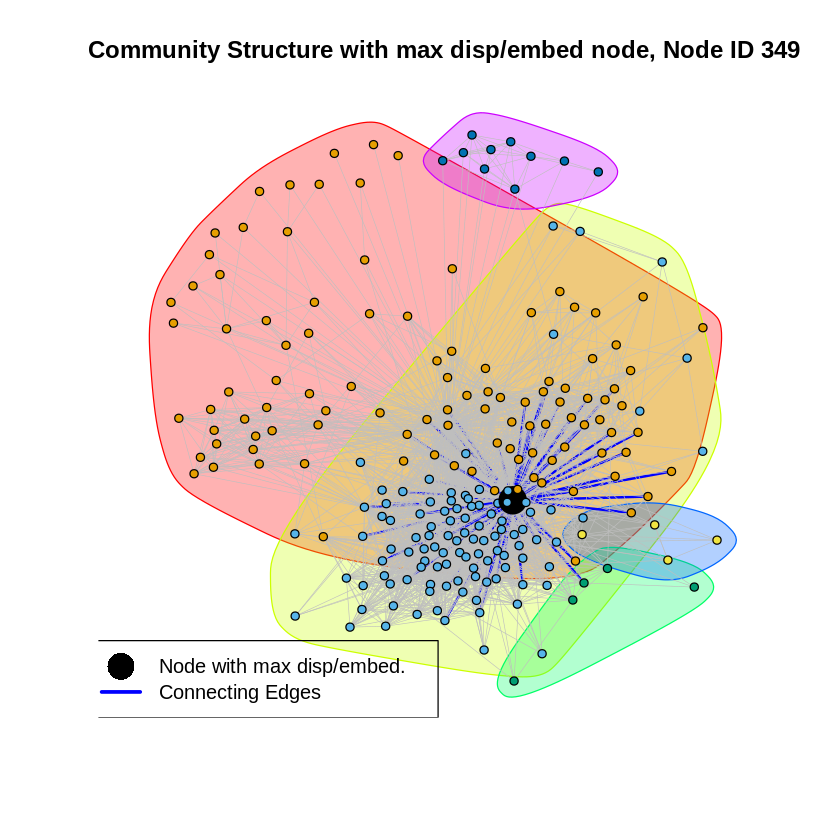

[1] "Node with maximum dispersion/embeddedness ratio for Node ID: 484 is 107"


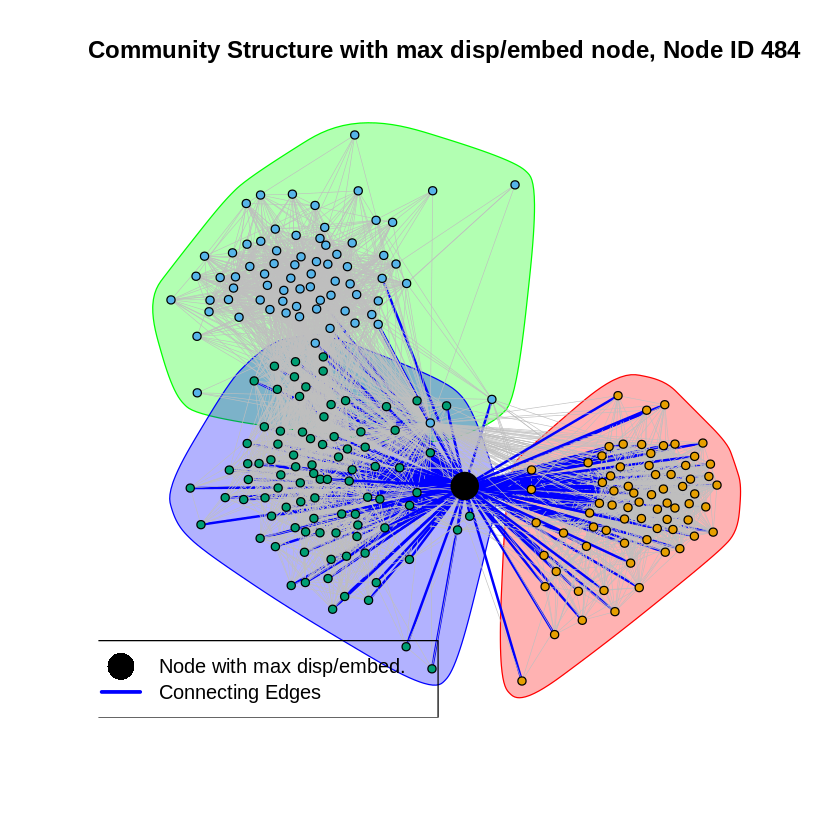

[1] "Node with maximum dispersion/embeddedness ratio for Node ID: 1087 is 107"


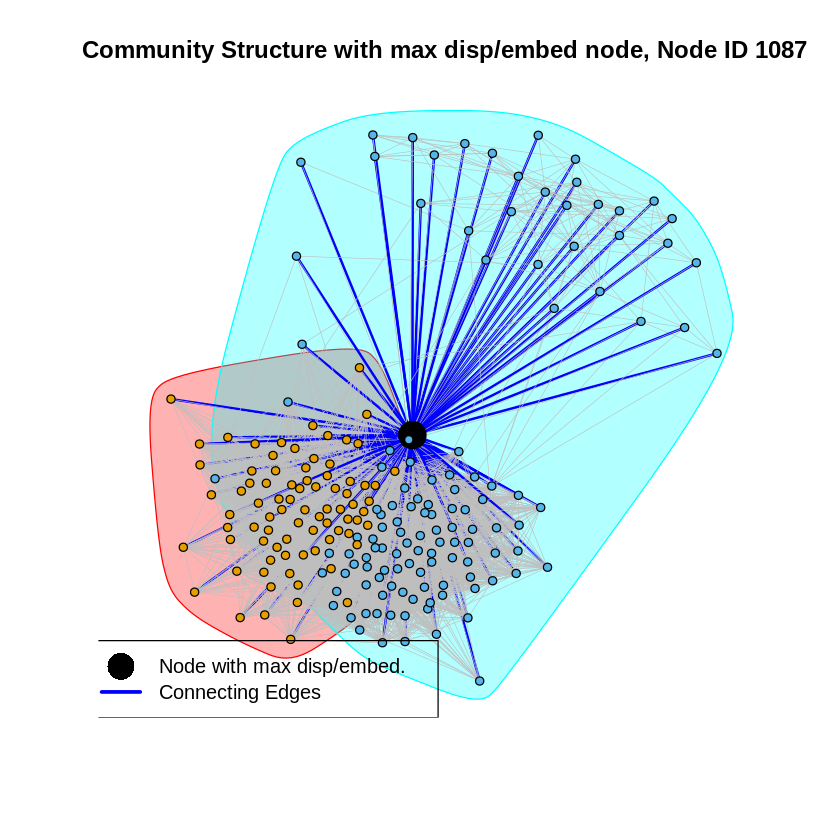

In [ ]:
node_ids <- c('0','107','348','483','1086')
node_ids_for_printing <-c(1,108,349,484,1087)
graph <- make_ego_graph(facebook_graph,1,nodes=node_ids)
for(i in 1:length(node_ids))
{
  mx_node <- max_disp_embeddedness_node[i]
  graph_to_work_on <-graph[[i]]
  community <- cluster_fast_greedy(graph_to_work_on)
  vertex_col = rep(community$membership,vcount(graph_to_work_on))
  vertex_col[which(V(graph_to_work_on)$name == mx_node)] = "black";
    
  vertex_size = rep(3,vcount(graph_to_work_on))
  vertex_size[which(V(graph_to_work_on)$name == mx_node)]=10
  edge_color <- rep("gray",ecount(graph_to_work_on))
  el_list <- get.edgelist(graph_to_work_on,name=TRUE)
  edge_color[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]='blue'
  edge_width <- rep(0.5,ecount(graph_to_work_on))
  edge_width[which(el_list[,1]==mx_node | el_list[,2]==mx_node)]=2
  plot(graph_to_work_on,mark.groups= groups(community), edge.arrow.size=0.5,vertex.color=vertex_col,vertex.size = vertex_size,edge.width = edge_width,edge.color=edge_color,vertex.label=NA)
  title(sprintf("Community Structure with max disp/embed node, Node ID %d",node_ids_for_printing[i]))
  legend('bottomleft', bg="transparent",legend = c("Node with max disp/embed.", "Connecting Edges"),lty = c(0, 1), lwd = c(5,3), pch=c(16,NA),col = c('black','blue'), pt.cex=3)
  print(sprintf("Node with maximum dispersion/embeddedness ratio for Node ID: %d is %s",node_ids_for_printing[i],mx_node))
}

**Question 16**

In [ ]:
table=read.table("facebook_combined.txt")
facebook_graph <- graph.data.frame(table, directed=FALSE)
graph_414 <- make_ego_graph(facebook_graph, nodes=c('414'))
node_degree = degree(graph_414[[1]])
Nr = which(node_degree==24,arr.ind=TRUE)
print(length(Nr))
print(Nr)

[1] 11
496 578 600 615 618 627 643 658 659 661 662 
 31  53  73  83  86  94 108 120 121 122 123 


**Question 17**

In [ ]:
common_measure <- function(G,i,j)
{
  length(intersection(neighbors(G,i,mode=c('all')),neighbors(G,j,mode='all')))
}

jaccard_measure <- function(G,i,j)
{
  neighbors_1<-neighbors(G,i)
  neighbors_2<-neighbors(G,j)
  jaccard_measure<- length(intersection(neighbors_1,neighbors_2))/length(union(neighbors_1,neighbors_2)) 
  jaccard_measure
}

adamic_adar_measure <- function(G,i,j)
{
  neighbors_1<-neighbors(G,i)
  neighbors_2<-neighbors(G,j)
  intersect  =intersection(neighbors_1,neighbors_2)
  degree_intersection = degree(G,intersect)
  log_degree_intersection <-log10(degree_intersection)
  inverse = 1/log_degree_intersection 
  sum(inverse)
} 

In [ ]:
calc_accuracy <- function(original_graph,graph_with_new_friends,node_j)
{
  neighbors_1 = neighbors(original_graph,node_j)
  neighbors_2 = neighbors(graph_with_new_friends,node_j)
  intersect = intersection(neighbors_1,neighbors_2)
  length(intersect)/length(neighbors_1)
}

graph_without_friends<-function(graph,prob,node_j)
{
  myedges <-incident(graph, v=node_j, mode = c("all"))
  sample(myedges, prob*degree(graph,v=node_j))

}


friendship_recommendation_based <- function(graph,node_j,metric,n_recommendation)
{
  friends <- neighbors(graph,node_j,mode=c('all'))
  vertex <- V(graph)
  not_friends <- vertex[!vertex %in% friends]
  per_node_recommendation <- c()
  for (k in not_friends)
  {
    temp <-NA
    if(metric=="common-measure")
    {
      temp <-common_measure(graph,node_j,k)
    }
    else if (metric=="jaccard")
    {
      temp <-jaccard_measure(graph,node_j,k)
    }
    else
    {
      temp <- adamic_adar_measure(graph,node_j,k)
    }
    per_node_recommendation <- c(per_node_recommendation,temp)
  }
  ordered = order(per_node_recommendation,decreasing=TRUE)
  recommended_friends = not_friends[ordered[c(1:n_recommendation)]]
  recommended_friends
}
add.edges <-function(graph,node_j,friendslist)
{
  for(i in friendslist)
  {
    graph <- graph+edge(node_j,i)
  }
  graph
}

get_one_trial<- function(graph,cutting_prob,metric,node_j)
{

  deleted_friends <- graph_without_friends(graph,cutting_prob,node_j)
  new_graph_without_friends <- delete.edges(graph,deleted_friends)
  recommended_friends <- friendship_recommendation_based(new_graph_without_friends,node_j,metric,length(deleted_friends))
  new_graph_with_friends = add.edges(new_graph_without_friends,node_j,recommended_friends)
  accuracy_score <- calc_accuracy(graph,new_graph_with_friends,node_j)
  accuracy_score
}

In [ ]:
n_trials <-10
graph_414 <- make_ego_graph(facebook_graph, nodes=c('414'))
graph_to_work_on <- graph_414[[1]]
vertices <- V(graph_to_work_on)
Nr <- c()
for( i in 1:length(degree(graph_to_work_on)))
{
  if(degree(graph_to_work_on,i)==24)
  {
    Nr <- c(Nr,i)
  }
}
nodes_to_visit <- vertices[Nr]
recommendation_algos <- c("common-measure","jaccard","adamic-adar")
total_accuracy <-NA
cutting_one_edge <- 0.75
for(i in recommendation_algos)
{
  per_node_accuracy = c()
  for(p in nodes_to_visit)
  {
    acc <- 0
    for(k in 1:n_trials)
    {
      acc <- acc + get_one_trial(graph_to_work_on,cutting_one_edge,i,p)
    }
    per_node_accuracy = c(per_node_accuracy,acc/n_trials)
  }
  total_accuracy <- mean(per_node_accuracy)
  print(sprintf("The accuracy of the %s algorithm is %0.3f",i,total_accuracy))
}

[1] "The accuracy of the common-measure algorithm is 0.879"
[1] "The accuracy of the jaccard algorithm is 0.851"
[1] "The accuracy of the adamic-adar algorithm is 0.882"
